In [1]:
import numpy as np
import pandas as pd
import sunpy
import matplotlib.pyplot as plt

from sunpy.timeseries import TimeSeries
from sunpy.time import TimeRange, parse_time
from sunpy.net import hek, Fido, attrs as a
from astropy.io import fits
import astropy.units as u
import matplotlib.pyplot as plt
import drms
import sunpy.map
from sunpy.net import Fido, attrs as a
from astropy.time import Time,TimeDelta

In [ ]:
result = Fido.search(a.Time('2014/1/7T18:30:00', '2014/1/7T19:33:00'), a.Instrument('AIA')) 

In [ ]:
print(result)

In [ ]:

#print(str((result[0,1])))

Right now I am just grabbing the first image so I can inspect it and see where the reuqired metadata is

In [ ]:
result[0,0]

In [ ]:

#goes = TimeSeries(files)

In [ ]:
cd "jsoc"

In [ ]:
ls

In [ ]:
hmi_map = sunpy.map.Map("/Users/Alexander_2/sunpy/data/aia_lev1_94a_2014_01_07t18_30_01_12z_image_lev1.fits")

In [ ]:
hmi_map

In [ ]:
ig = plt.figure()
hmi_map.plot()
plt.show()

In [ ]:
hmi_map2 = sunpy.map.Map("aia.lev1.94A_2012-03-04T04:29:14.12Z.image_lev1.fits")

In [ ]:
ig = plt.figure()
hmi_map2.plot()
plt.show()

In [ ]:
file =sunpy.io.read_file("aia.lev1.94A_2012-03-04T04:19:26.12Z.image_lev1.fits")

In [ ]:
print(file[1])

In [ ]:
file2 =sunpy.io.read_file("/Users/Alexander_2/sunpy/data/aia_lev1_94a_2014_01_07t18_30_01_12z_image_lev1.fits")

In [ ]:
print(file2[1])

In [ ]:

flares_2014 = open("goes-xrs-report_2014.txt",'r')

In [ ]:
some_flares = open("flares_2010-2016",'x')

In [ ]:
half_flares = open("flares_2010-2016",'a')
base_front = 'goes-xrs-report_20'
base_end = '.txt'
for i in range(11,17):
    if(i < 10):
        addition = '0' + str(i)
    else:
        addition = str(i)
    url = base_front + addition + base_end
    curr_flares = open(url,'r')
    contents = curr_flares.read()
    half_flares.write(contents)
    curr_flares.close()
    print(url)
half_flares.close()    
half_flares = open("flares_2010-2016",'r')

In [2]:
half_flares = open("flares_2010-2016",'r')

In [ ]:
all_flares = open("flares_2004-2016",'a')
base_front = 'goes-xrs-report_20'
base_end = '.txt'
for i in range(4,17):
    if(i < 10):
        addition = '0' + str(i)
    else:
        addition = str(i)
    url = base_front + addition + base_end
    curr_flares = open(url,'r')
    contents = curr_flares.read()
    all_flares.write(contents)
    curr_flares.close()
    print(url)
all_flares.close()    
all_flares = open("flares_2004-2016",'r')

Here I parse the flare catalog, retreiving the class, numeric intensity, and max time for each. Perhaps I should do more preprocessing I don't know

In [3]:
date = []
max_time = []
class_flare = []
intensity = []
for line in half_flares.readlines():
    print(line)
    line = line.split()
    if((line[4][0] == 'S') or (line[4][0] == 'N')):
        del line[4]
    date.append('20'+line[0][5:7]+'-'+line[0][7:9]+'-'+line[0][9:11]+'T'+line[2][0:2]+':'+line[2][2:4]+':00')
    max_time.append(line[3])
    class_flare.append(line[4])
    intensity.append(line[5])
        

31777110101  0017 0030 0022                                B 23    G15  1.4E-04 

31777110101  0049 0057 0053                                B 22    G15  7.3E-05 11140

31777110101  1811 1820 1814                                B 21    G15  8.1E-05 

31777110101  1937 1951 1944                                B 31    G15  1.9E-04 11140

31777110101  2152 2206 2159                                B 83    G15  4.5E-04 11140

31777110102  0903 0922 0910                                B 46    G15  4.0E-04 11140

31777110102  1601 1610 1607                                B 30    G15  9.6E-05 11140

31777110102  1906 1924 1915                                B 15    G15  1.4E-04 11140

31777110102  2009 2016 2012                                B 23    G15  6.1E-05 11140

31777110103  0436 0446 0441                                B 14    G15  6.0E-05 

31777110103  1319 1333 1325                                B 26    G15  1.6E-04 11141

31777110103  1344 1411 1353                               

31777120412  2324 2330 2328                                B 32    G15  6.8E-05                               

31777120413  0411 0439 0421                                B 47    G15  6.4E-04                               

31777120413  0502 0512 0507                                B 56    G15  2.5E-04                               

31777120413  1434 1447 1438                                B 31    G15  1.9E-04                               

31777120413  2330 2339 2333                                B 33    G15  1.3E-04                               

31777120414  0035 0102 0047                                B 97    G15  1.1E-03                               

31777120414  0805 0818 0811                                B 51    G15  3.1E-04                               

31777120414  2210 2306 2218                                B 76    G15  1.9E-03                               

31777120415  0057 0205 0140                                C 27    G15  6.0E-03                         


31777130404  0949 1003 0957                                C 12    G15  7.6E-04                               

31777130404  1303 1308 1306                                B 62    G15  1.0E-04                               

31777130405  0348 0354 0352                                B 60    G15  1.3E-04                               

31777130405  0606 0811 0650                                C 21    G15  1.2E-02                               

31777130405  1734 1804 1748                                M 22    G15  2.6E-02                               

31777130406  0555 0604 0600 N23E43                         C 12    G15  4.4E-04 11718 130409.5                

31777130406  0639 0651 0646                                C 10    G15  5.1E-04                               

31777130406  0758 0809 0802 N21E40                         B 97    G15  4.9E-04 11718 130409.4                

31777130406  0937 0948 0944 N23E40                         C 11    G15  7.0E-04 11718 130409.4         

31777140508  0121 0206 0140                                C 30    G15  6.5E-03                               

31777140508  0920 1018 1007 N08E54                         M 53    G15  4.7E-02 12056 140512.4                

31777140508  1434 1518 1458                                C 13    G15  3.0E-03                               

31777140509  0048 0103 0055 N04E42                         C 14    G15  9.7E-04 12056 140512.1                

31777140509  0514 0527 0521 S16E74                         C 24    G15  1.3E-03 12058 140514.8                

31777140509  0814 0828 0819 S11E75                         C 33    G15  1.8E-03 12058 140514.9                

31777140509  1114 1128 1119 S12E72                         C 16    G15  9.4E-04 12058 140514.8                

31777140509  1145 1151 1148 N14E25                         C 12    G15  2.7E-04 12055 140511.3                

31777140509  1253 1309 1259 S15E73                         C 19    G15  1.4E-03 12058 140515.0          


31777150917  1550 1612 1555                                B 85    G15  8.5E-04                               

31777150917  1716 1752 1726 S19W11                         C 13    G15  2.1E-03 12415 150916.8                

31777150917  1808 1827 1818 S20W10                         C 32    G15  2.7E-03 12415 150916.9                

31777150917  1910 1929 1922                                C 16    G15  1.6E-03                               

31777150917  1947 1957 1954 S19W12                         C 33    G15  1.1E-03 12415 150916.9                

31777150917  2107 2119 2115 S19W12                         C 67    G15  2.6E-03 12415 150916.9                

31777150917  2233 2240 2237 S17W15                         B 80    G15  2.0E-04 12415 150916.8                

31777150917  2256 2305 2300 S19W15                         C 39    G15  1.2E-03 12415 150916.8                

31777150918  0105 0119 0112 S21W11                         C 13    G15  7.8E-04 12415 150917.2         

31777160910  2049 2105 2059                                B 21    G15  1.7E-04                               

31777160913  0440 0447 0444                                B 26    G15  7.4E-05                               

31777160914  1540 1550 1544                                B 19    G15  8.5E-05                               

31777160914  1906 1924 1911                                B 23    G15  2.1E-04                               

31777160915  0315 0326 0320                                B 23    G15  1.2E-04                               

31777160915  0427 0443 0438                                B 41    G15  3.3E-04                               

31777160916  0743 0757 0747                                B 23    G15  1.6E-04                               

31777160916  1203 1358 1221                                B 29    G15  1.8E-03                               

31777160917  0555 0618 0605                                B 40    G15  4.1E-04                         

Just counting occourences of each flare type

In [4]:
X = 0
M = 0
C = 0
B = 0
for flare in class_flare:
    if(flare == 'X'):
        X = X +1
    elif(flare == 'M'):
        M = M + 1
    elif(flare == 'C'):
        C = C + 1
    elif(flare == 'B'):
        B = B +1
print("There are " + str(X) + " X class flares between 2011 and 2016")    
print("There are " + str(M) + " M class flares between 2011 and 2016")    
print("There are " + str(C) + " C class flares between 2011 and 2016")    
print("There are " + str(B) + " B class flares between 2011 and 2016")    

There are 45 X class flares between 2011 and 2016
There are 658 M class flares between 2011 and 2016
There are 7215 C class flares between 2011 and 2016
There are 3691 B class flares between 2011 and 2016


In [ ]:
t = Time(date[4])
t.format = 'datetime'
print(t)
print(start_t)
print(end_t)

In [ ]:
dt2 = TimeDelta(120.0, format='sec')
start_t = t - dt2
end_t = t+dt2

In [5]:
def get_metadata(time_start,time_end,wavelength):
    if(wavelength==False):
        metadata = client.search_metadata(
                       a.Time(time_start, time_end),
                        a.jsoc.Series('aia.lev1_euv_12s'),a.jsoc.Segment('image')) 
    else:
        metadata = client.search_metadata(
                       a.Time(time_start, time_end),
                        a.jsoc.Series('aia.lev1_euv_12s'), a.jsoc.Wavelength(wavelength*u.AA),a.jsoc.Segment('image')) 
    return metadata
        

In [9]:
import astropy.units as u
from sunpy.net import jsoc
from sunpy.net import attrs as a
client = jsoc.JSOCClient()  
metadata = client.search_metadata(
                       a.Time(start_t, end_t),
                        a.jsoc.Series('aia.lev1_euv_12s'), a.jsoc.Wavelength(304*u.AA),a.jsoc.Segment('image'))  

NameError: name 'start_t' is not defined

In [ ]:
metadata=get_metadata(start_t,end_t,131)
print(metadata)

In [6]:

deviation = []
new_list = []
av = 0
time = []
for i in range (len(metadata["EXPTIME"])):
    if((metadata["EXPTIME"][i]) != 0):
        av += (metadata["EXPTIME"][i])
        new_list.append(metadata["EXPTIME"][i])
        time.append(metadata["DATE"][i])
av = av / (len(metadata["EXPTIME"]))
for i in range (len(new_list)):
    
    deviation.append(np.abs(new_list[i]-2.95))

NameError: name 'metadata' is not defined

In [ ]:
print(metadata["WAVELNTH"])

In [ ]:
print(max(new_list))
print(new_list.index(min(new_list)))

In [ ]:
print(new_list)

In [ ]:
(time[0:30])

In [ ]:
plt.plot(new_list)


In [ ]:
av_old = 2.885371865945005

In [ ]:
av

So, for the M and X class flares I'm going to look through the metadata of a sample, maybe 10-20, and see which gives the highest varience at a flare time. I'll go back and lookat this for the C class to see if I can decipher any but it doesnt really matter. Once I've chosen a frequency I'll try and find some sort of cut off. Would the frequency change with different class flares? Probably right since theyll be different energies

In [6]:
#finds the flares of a certain type in the catalog, retreives aia metadata in the hour surrounding flare, gets exptime,
#if the exp time is shorter than a certain threshold appends the delta exposure to a list
def find_flares(f_type,count,flare_list,date_list,wave):
    mins = []
    maxes = []
    valid = []
    delta_exp= []
    given = 0
    decidable =0
    index = 1
    #valid is the time
    for i in range(len(flare_list)):
        if(flare_list[i] == f_type):
            given = given +1
            max_time = date_list[i]
            max_t = Time(max_time)
            max_t.format = 'datetime'

            dt = TimeDelta(60.0*30, format='sec')
            start_t_m = max_t - dt
            end_t_m = max_t+dt
            metadata = get_metadata(start_t_m,end_t_m,wave)
            deviation = []
            exposure = []
            av = 0
            time = []
            #print(max_t)
            #print(metadata["EXPTIME"])
            for i in range (len(metadata["EXPTIME"])):
                if((metadata["EXPTIME"][i]) != 0):
                    av += (metadata["EXPTIME"][i])
           w         exposure.append(metadata["EXPTIME"][i])
                    time.append(metadata["DATE"][i])
            av = av / (len(metadata["EXPTIME"]))
            if(min(exposure)<=1.2):
                decidable = decidable + 1
                mins.append(min(exposure))
                maxes.append(max(exposure))
                delta_exp.append(max(exposure)-min(exposure))
                valid.append(max_time)
            print(str(wave) + "Å") 
            #print("the numerical class is " + str(intensity))
            plt.plot(exposure)
            plt.show()
            
            if(index == count):
                break
            if(count == False):
                index = 0
            index = index + 1
    print("the max exposure times are " + str(maxes))   
    print("the min exposure times are " + str(mins))
    print("out of " +str(given) + " given flare times, " + str(decidable) + " were able to be found at"+str(wave)  +"Å")
    #delta_exp= str(maxes) - str(mins)
    return delta_exp

In [ ]:
new_list = find_flares('X',1,class_flare,date)

In [ ]:
plt.plot(new_list)

In [ ]:
new_list = find_flares('M',1,class_flare,date,94)

In [ ]:
new_list = find_flares('C',1,class_flare,date)

In [ ]:
new_list = find_flares('X',1,class_flare[0:46],date,False)

In [7]:
from statistics import mean
valid_wavelengths = [304,171,193,211,335,94,131]
def find_most_variance(searching_class,class_flare,number_flares,date):
    #the number of catches for each wavelength with a non null catch list
    num_valid = []
    #the average exposure of wavelentsh with a non null catch list
    average_exp = []
    #the wavelengths of non null catch lists
    valid_wave = []
    #the list of wavelengths with the most catches
    most_catches = []
    #the list of the average exposure times of the wavelengts with the most catches, share indecies with most_catches
    valid_exposures = []
    for wave in valid_wavelengths:
        #we get a list of the delta exposures in a wavelength, truncated if below some cutoff
        curr_list = ((find_flares(searching_class,number_flares,class_flare,date,wave)))
        print("delta exps are" +str(curr_list))
        #if the list is not truncated, get number of visable events, average delta exp, and wavelength
        if(len(curr_list) != 0):
            num_valid.append(len(curr_list))
            average_exp.append(mean(curr_list))
            valid_wave.append(wave)
    #get the max number of events found from all the wavelengts
    max_finds = max(num_valid)
    print("max finds are")
    print(max_finds)
    #see if this corresponds to more than one wavelength
    for index in range(len(num_valid)):
        if(num_valid[index] == max_finds):
            most_catches.append(valid_wave[index])
            valid_exposures.append(average_exp[index])
    longest_exp = most_catches[valid_exposures.index(max(valid_exposures))]
    
    print("The wavelegnth with the most discernable features was " + str(most_catches) + "Å")
    print("The wavelength with the highest average delta exposure was "+ str(longest_exp) + "Å" )

In [ ]:
new_list = find_flares('X',5,class_flare,date,193)

In [ ]:
len(new_list)

 Tbh 171 angstroms looks pretty bad for alot of the X class flares. Maybe it is just too energetic of a wavelenght? But either eay the peaks are very steep.
 
 I'm just gonna chose 131, maybe its not the best choice but it is a choice

304Å


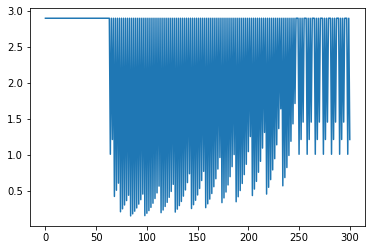

304Å


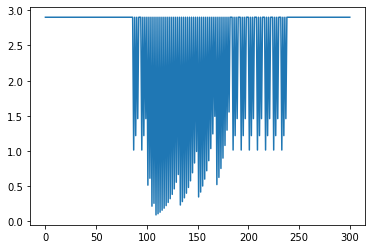

304Å


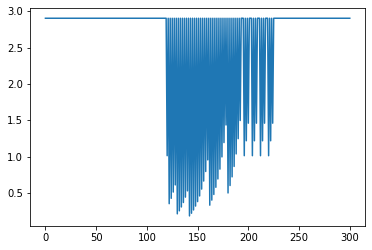

304Å


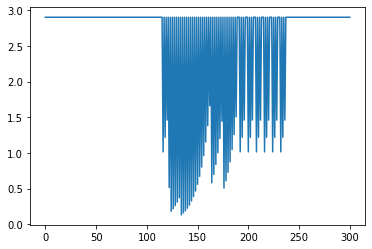

304Å


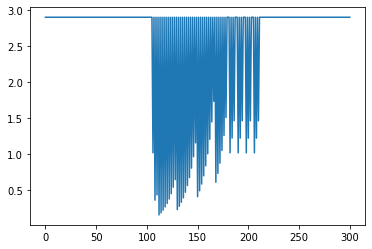

304Å


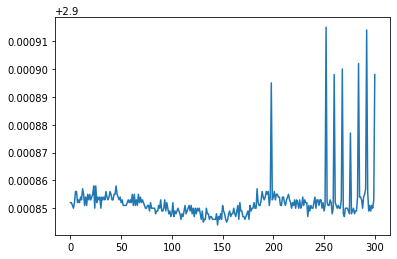

304Å


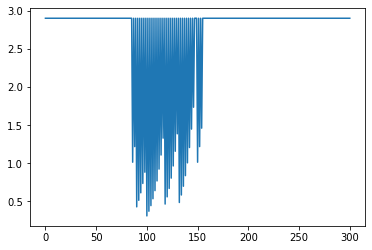

304Å


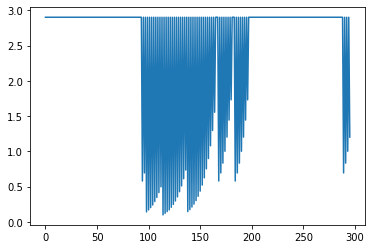

304Å


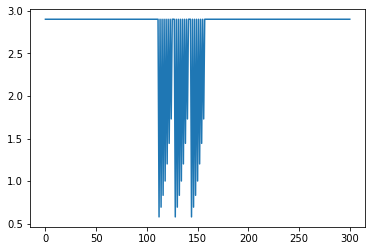

304Å


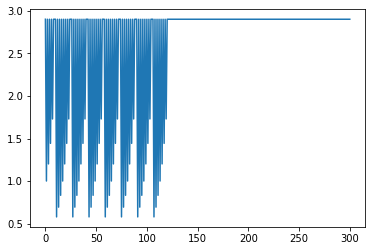

304Å


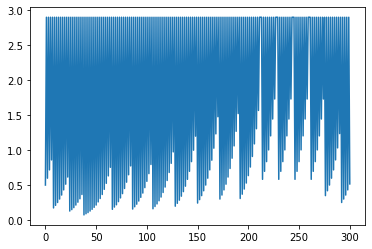

304Å


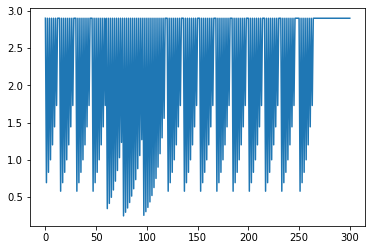

304Å


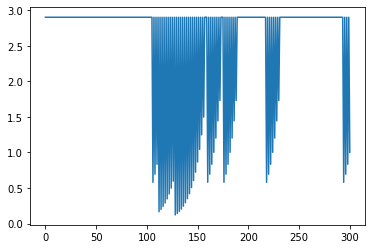

304Å


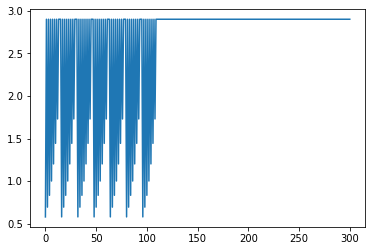

304Å


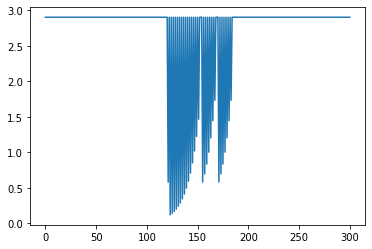

304Å


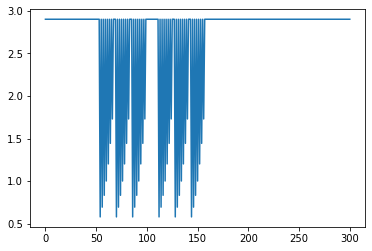

304Å


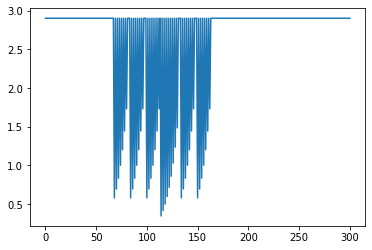

304Å


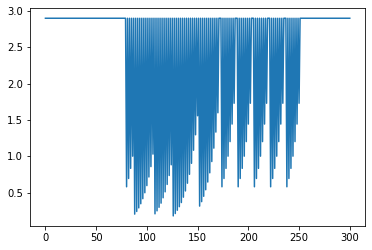

304Å


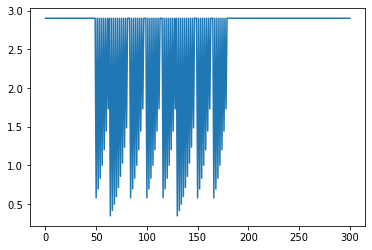

304Å


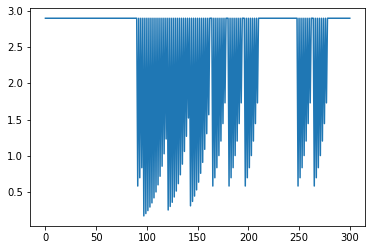

the max exposure times are [2.902185, 2.901067, 2.902135, 2.9021060000000003, 2.902136, 2.900906, 2.902091, 2.902095, 2.9020669999999997, 2.900841, 2.900841, 2.90213, 2.9020770000000002, 2.902093, 2.902068, 2.902081, 2.9020740000000003, 2.9020770000000002, 2.902082]
the min exposure times are [0.157755, 0.08970399999999999, 0.186433, 0.129495, 0.149503, 0.308058, 0.09880499999999999, 0.579585, 0.579597, 0.068606, 0.24659299999999998, 0.12091500000000001, 0.579588, 0.116559, 0.5796, 0.346142, 0.178206, 0.346124, 0.165847]
out of 20 given flare times, 19 were able to be found at304Å
delta exps are[2.74443, 2.811363, 2.715702, 2.7726110000000004, 2.752633, 2.592848, 2.803286, 2.3225100000000003, 2.3224699999999996, 2.832235, 2.654248, 2.781215, 2.322489, 2.7855339999999997, 2.3224679999999998, 2.555939, 2.7238680000000004, 2.555953, 2.736235]
171Å


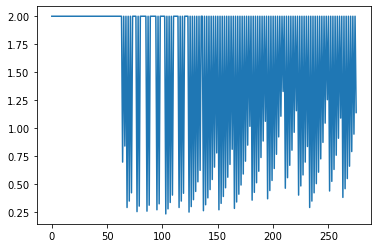

171Å


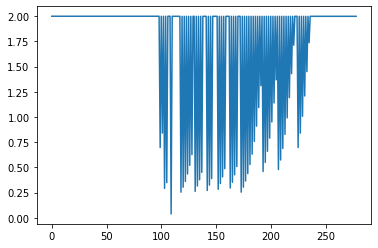

171Å


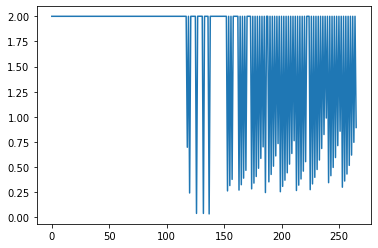

171Å


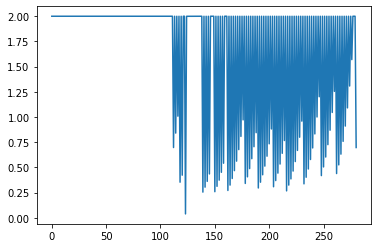

171Å


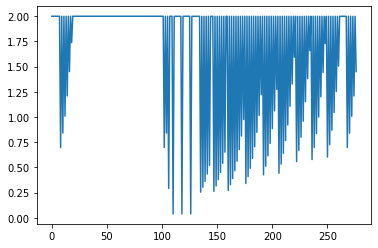

171Å


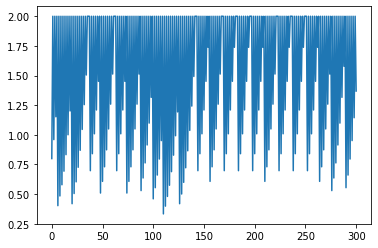

171Å


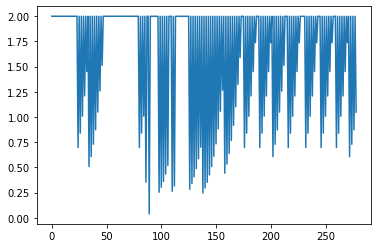

171Å


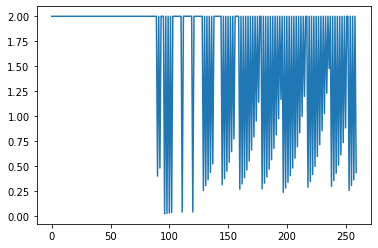

171Å


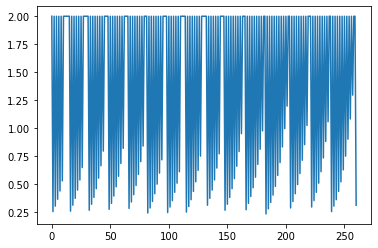

171Å


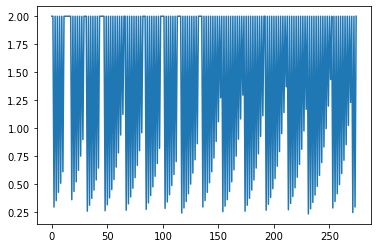

171Å


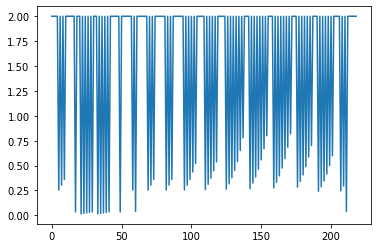

171Å


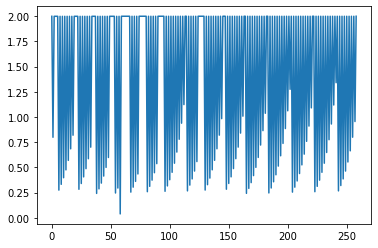

171Å


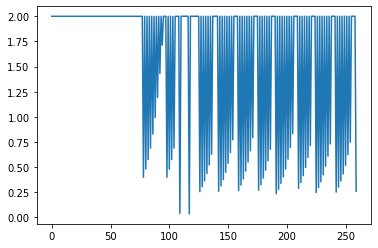

171Å


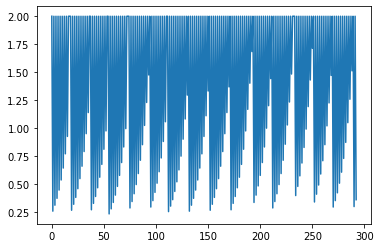

171Å


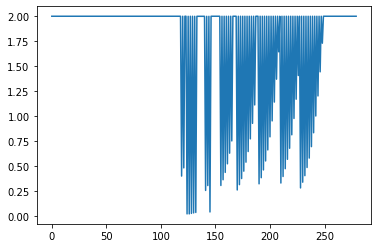

171Å


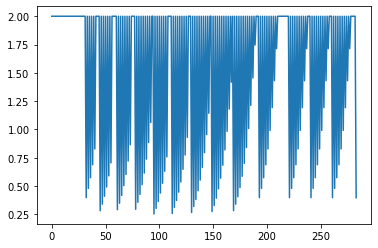

171Å


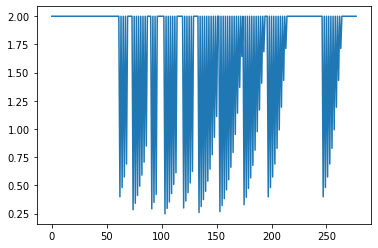

171Å


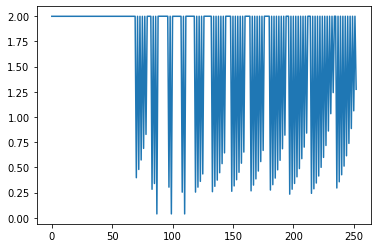

171Å


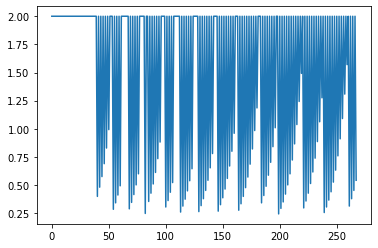

171Å


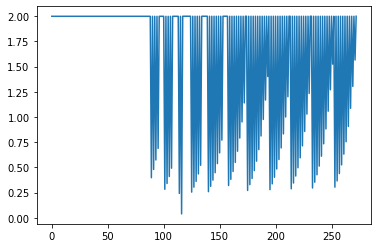

the max exposure times are [2.000204, 2.000205, 2.0001919999999997, 2.000203, 2.000198, 2.000226, 2.0001919999999997, 2.0001849999999997, 1.999511, 1.9995029999999998, 2.000064, 2.000064, 2.000067, 1.9995490000000002, 2.000184, 1.99963, 1.999616, 2.000184, 2.0001919999999997, 2.0001830000000003]
the min exposure times are [0.23480399999999998, 0.038976, 0.034098, 0.038985, 0.038986, 0.333119, 0.038978, 0.019493, 0.234116, 0.23411700000000002, 0.014603999999999999, 0.038976, 0.034079000000000005, 0.23415999999999998, 0.019465, 0.254701, 0.246504, 0.038949, 0.24300100000000002, 0.038966]
out of 20 given flare times, 20 were able to be found at171Å
delta exps are[1.7654, 1.961229, 1.9660939999999998, 1.961218, 1.9612120000000002, 1.6671070000000001, 1.9612139999999998, 1.9806919999999997, 1.765395, 1.765386, 1.98546, 1.9610880000000002, 1.965988, 1.7653890000000003, 1.980719, 1.744929, 1.753112, 1.961235, 1.7571909999999997, 1.9612170000000002]
193Å


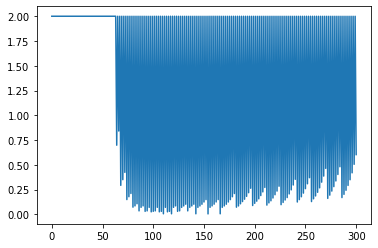

193Å


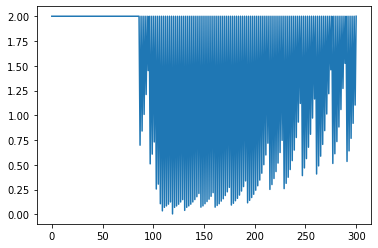

193Å


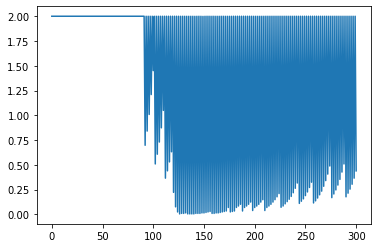

193Å


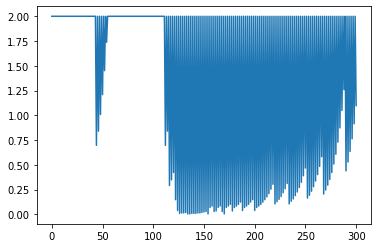

193Å


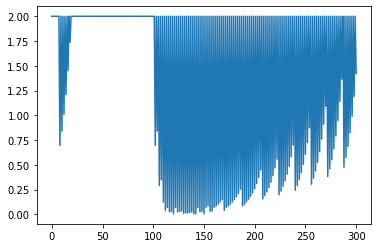

193Å


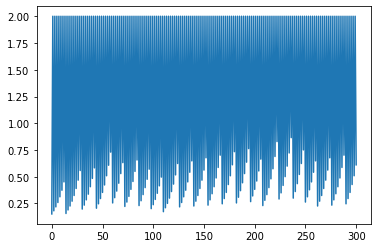

193Å


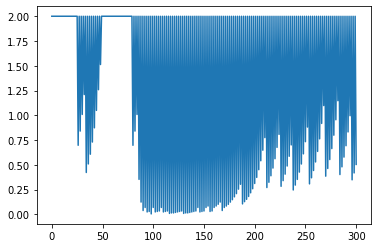

193Å


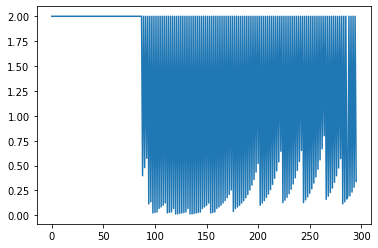

193Å


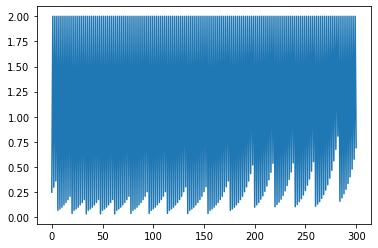

193Å


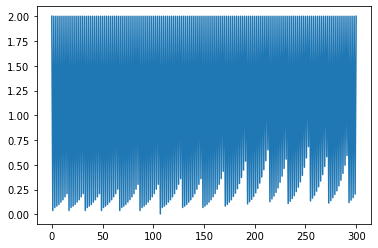

193Å


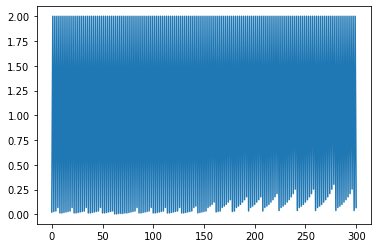

193Å


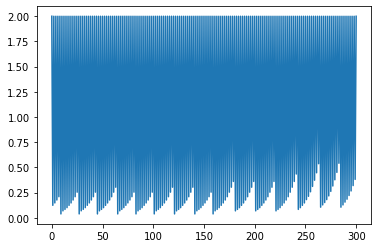

193Å


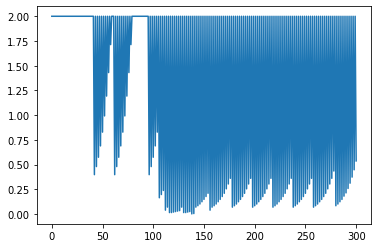

193Å


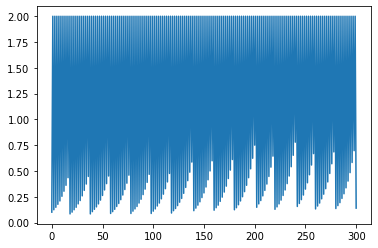

193Å


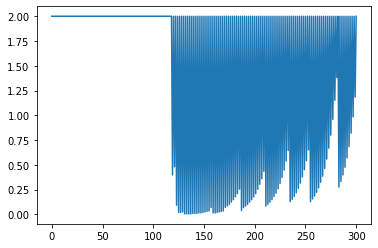

193Å


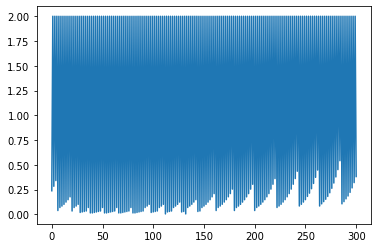

193Å


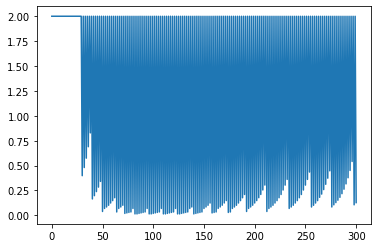

193Å


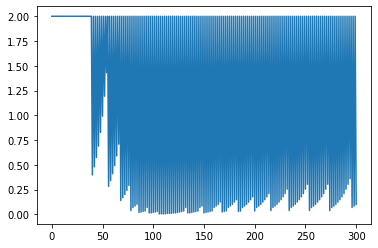

193Å


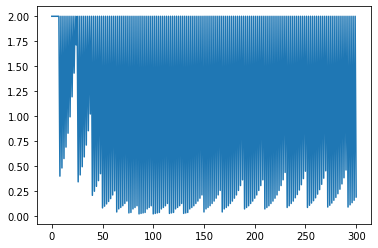

193Å


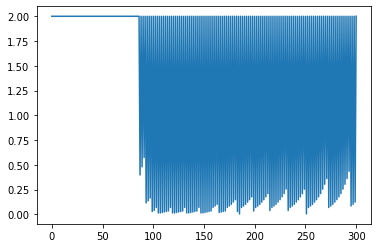

the max exposure times are [2.000096, 2.000089, 2.0000869999999997, 2.0000869999999997, 2.000099, 2.000104, 2.000091, 2.000085, 1.999856, 1.9998470000000002, 1.999852, 1.999852, 1.999855, 1.999591, 2.000068, 2.000077, 2.000069, 2.00007, 2.000069, 2.00006]
the min exposure times are [0.00371, 0.003635, 0.00487, 0.004915999999999999, 0.0048649999999999995, 0.15262, 0.00489, 0.014713, 0.034294, 0.004905, 0.004918, 0.039156, 0.001294, 0.083964, 0.004909, 0.004876, 0.014669999999999999, 0.004884, 0.01958, 0.004872]
out of 20 given flare times, 20 were able to be found at193Å
delta exps are[1.996386, 1.996454, 1.9952169999999998, 1.9951709999999998, 1.9952340000000002, 1.847484, 1.9952009999999998, 1.985372, 1.965562, 1.9949420000000002, 1.994934, 1.960696, 1.998561, 1.915627, 1.9951590000000001, 1.995201, 1.985399, 1.995186, 1.980489, 1.995188]
211Å


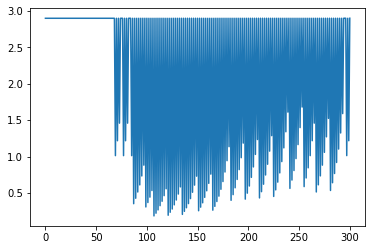

211Å


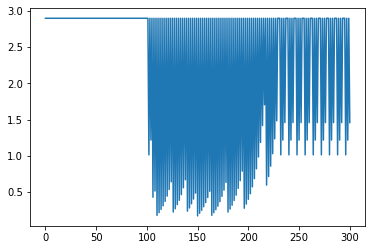

211Å


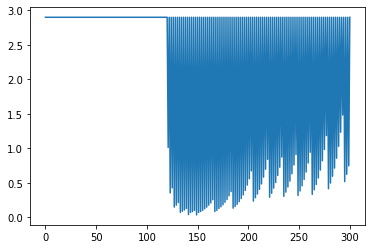

211Å


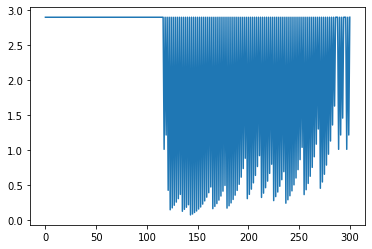

211Å


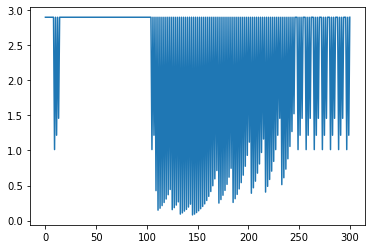

211Å


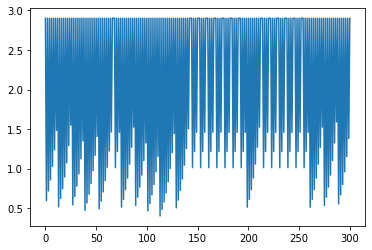

211Å


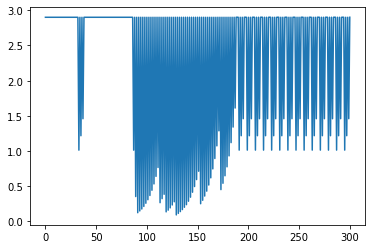

211Å


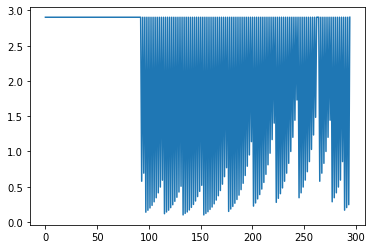

211Å


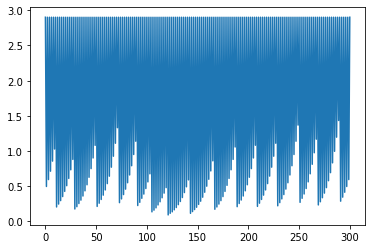

211Å


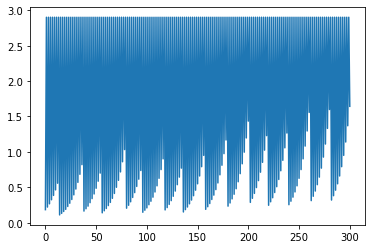

211Å


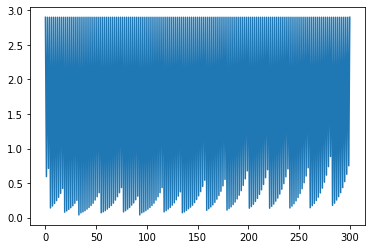

211Å


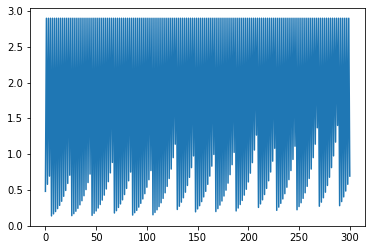

211Å


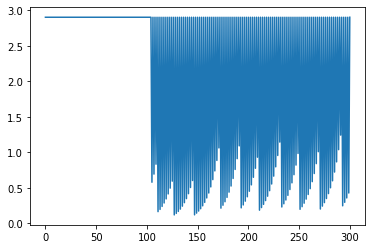

211Å


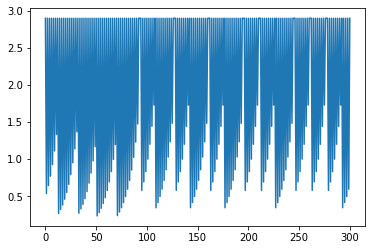

211Å


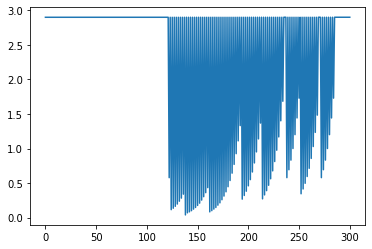

211Å


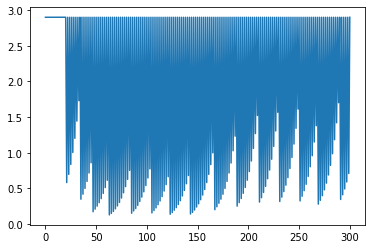

211Å


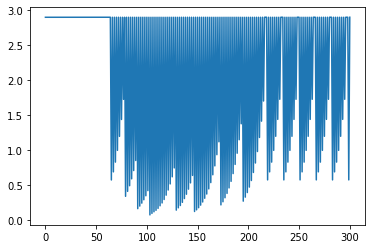

211Å


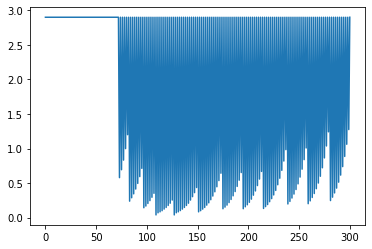

211Å


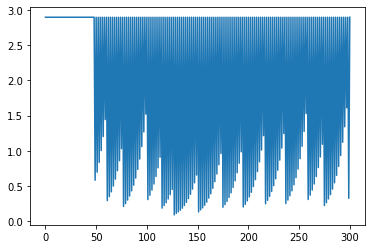

211Å


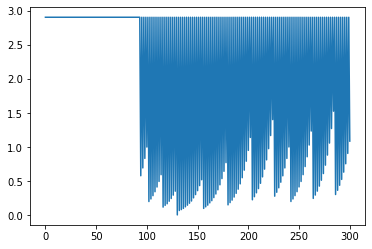

the max exposure times are [2.9012290000000003, 2.90121, 2.901217, 2.901272, 2.901241, 2.9008599999999998, 2.901282, 2.901236, 2.901007, 2.9010290000000003, 2.900996, 2.900998, 2.901034, 2.901019, 2.901204, 2.901223, 2.901224, 2.901245, 2.901218, 2.901235]
the min exposure times are [0.184104, 0.168728, 0.034318, 0.075198, 0.080506, 0.402213, 0.092151, 0.101937, 0.092689, 0.11074300000000001, 0.039159, 0.136169, 0.11868800000000002, 0.234461, 0.039133999999999995, 0.123403, 0.078894, 0.039127999999999996, 0.08419, 0.0049]
out of 20 given flare times, 20 were able to be found at211Å
delta exps are[2.7171250000000002, 2.732482, 2.866899, 2.826074, 2.820735, 2.4986469999999996, 2.8091310000000003, 2.799299, 2.808318, 2.7902860000000005, 2.861837, 2.7648289999999998, 2.782346, 2.6665579999999998, 2.86207, 2.7778199999999997, 2.82233, 2.862117, 2.817028, 2.8963349999999997]
335Å


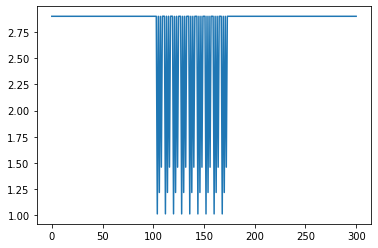

335Å


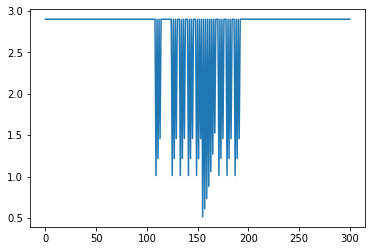

335Å


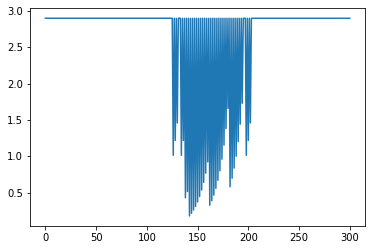

335Å


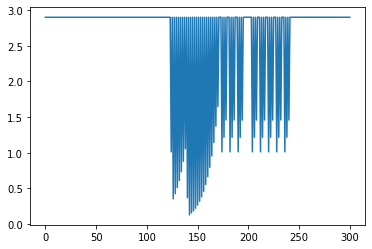

335Å


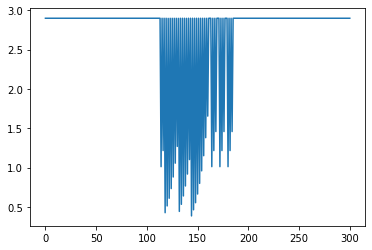

335Å


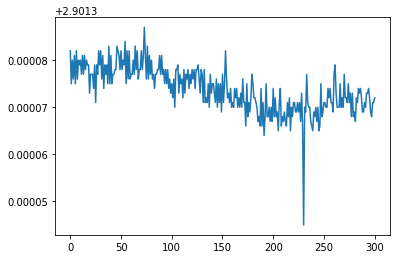

335Å


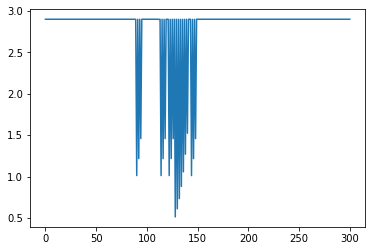

335Å


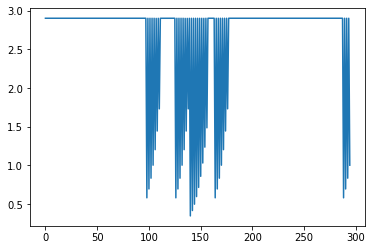

335Å


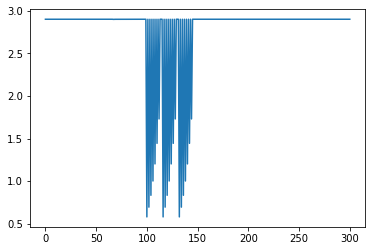

335Å


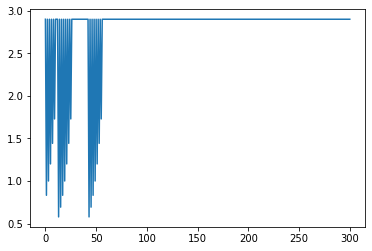

335Å


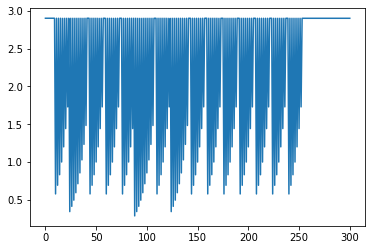

335Å


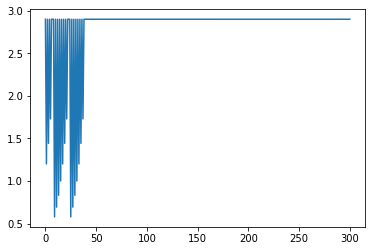

335Å


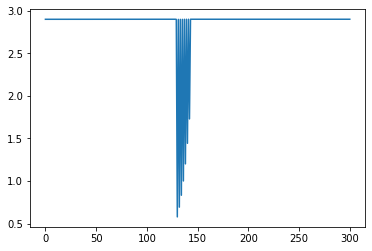

335Å


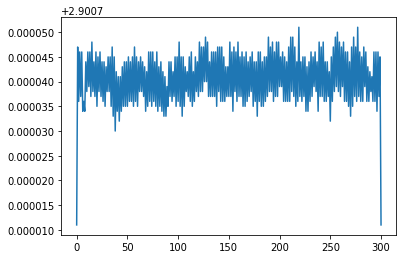

335Å


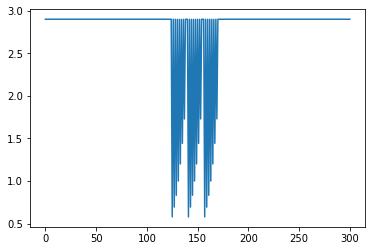

335Å


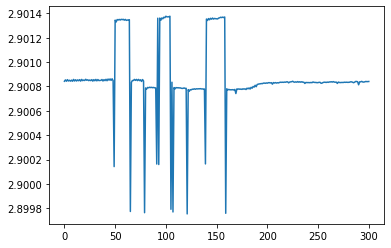

335Å


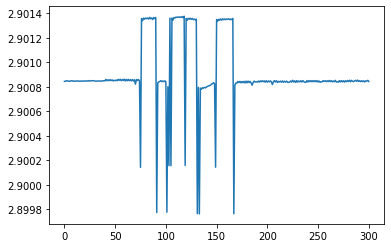

335Å


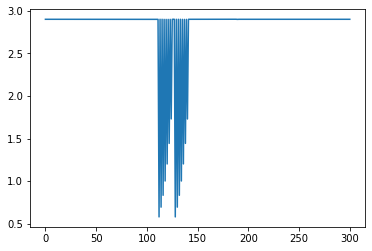

335Å


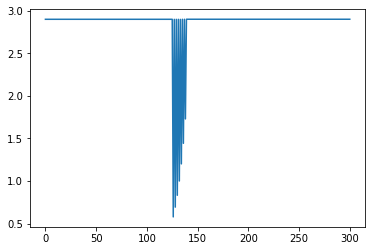

335Å


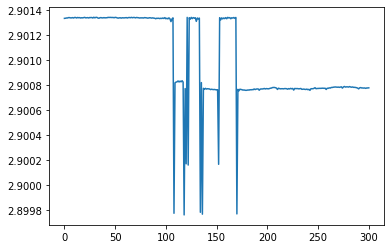

the max exposure times are [2.901347, 2.9008599999999998, 2.901365, 2.901355, 2.901377, 2.901386, 2.901341, 2.901216, 2.9007169999999998, 2.901226, 2.900713, 2.901247, 2.901337, 2.90137, 2.9013869999999997]
the min exposure times are [1.0125389999999999, 0.512843, 0.177432, 0.12818, 0.386374, 0.513368, 0.34481999999999996, 0.5787399999999999, 0.578236, 0.287921, 0.5781970000000001, 0.578218, 0.57835, 0.578893, 0.578385]
out of 20 given flare times, 15 were able to be found at335Å
delta exps are[1.888808, 2.3880169999999996, 2.723933, 2.773175, 2.515003, 2.3880179999999998, 2.556521, 2.322476, 2.322481, 2.613305, 2.3225160000000002, 2.323029, 2.322987, 2.322477, 2.323002]
94Å


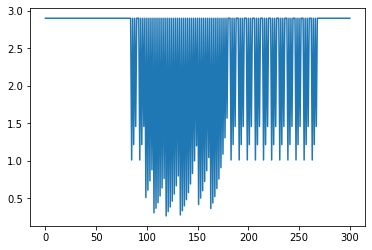

94Å


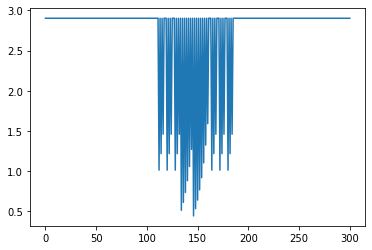

94Å


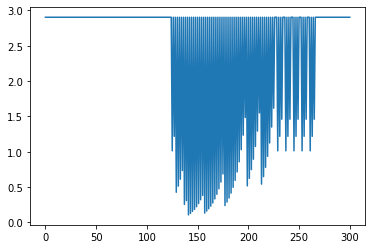

94Å


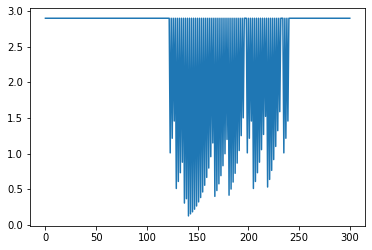

94Å


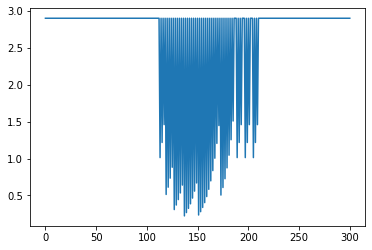

94Å


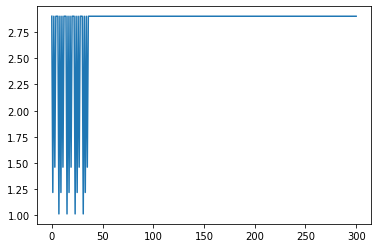

94Å


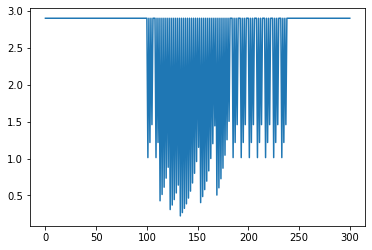

94Å


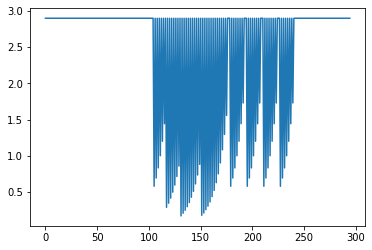

94Å


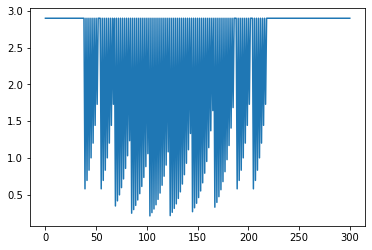

94Å


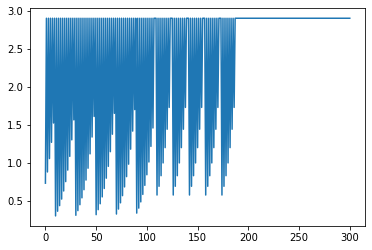

94Å


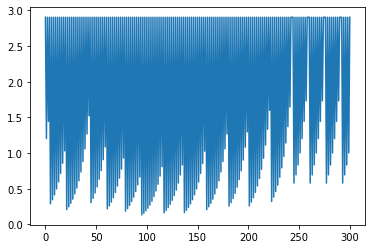

94Å


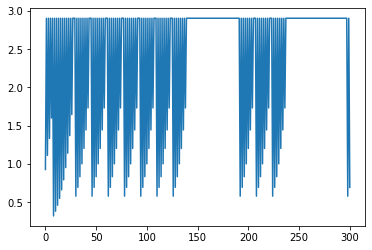

94Å


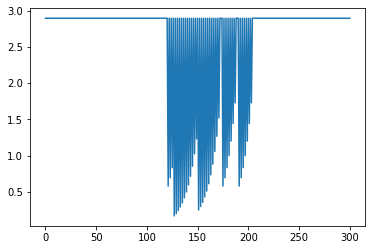

94Å


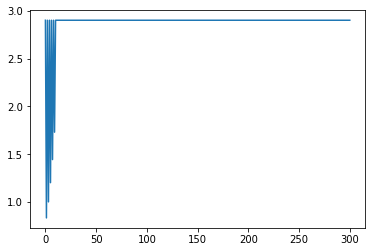

94Å


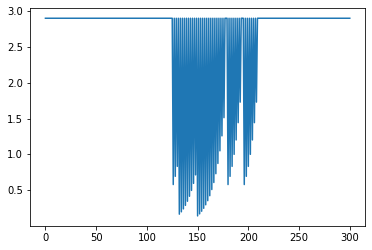

94Å


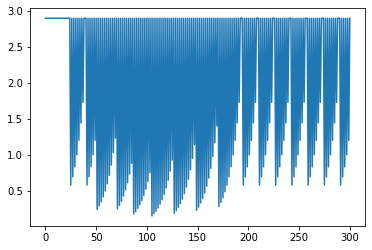

94Å


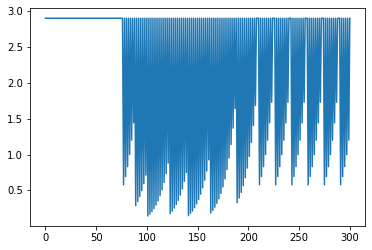

94Å


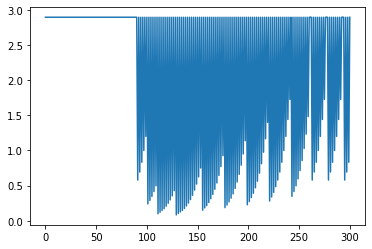

94Å


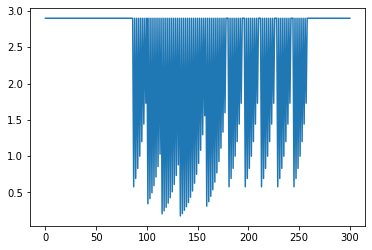

94Å


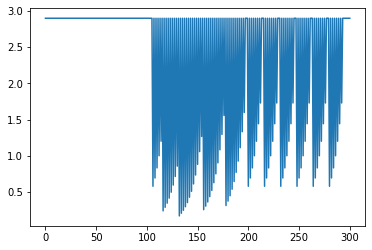

the max exposure times are [2.90109, 2.902206, 2.900876, 2.900892, 2.900884, 2.9020799999999998, 2.9021209999999997, 2.9008979999999998, 2.900839, 2.90084, 2.902114, 2.9020639999999998, 2.900857, 2.900845, 2.9008540000000003, 2.900848, 2.900843, 2.900855, 2.9008529999999997, 2.9008529999999997]
the min exposure times are [0.26728, 0.444543, 0.10633699999999999, 0.12804300000000002, 0.22202800000000003, 1.013623, 0.223273, 0.168705, 0.209721, 0.30393000000000003, 0.133489, 0.32154299999999997, 0.16462000000000002, 0.8322379999999999, 0.140348, 0.148519, 0.144372, 0.081012, 0.17695999999999998, 0.168728]
out of 20 given flare times, 20 were able to be found at94Å
delta exps are[2.63381, 2.457663, 2.794539, 2.772849, 2.678856, 1.8884569999999998, 2.678848, 2.7321929999999996, 2.691118, 2.5969100000000003, 2.768625, 2.5805209999999996, 2.7362369999999996, 2.068607, 2.7605060000000003, 2.752329, 2.756471, 2.819843, 2.723893, 2.732125]
131Å


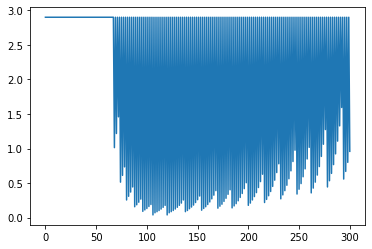

131Å


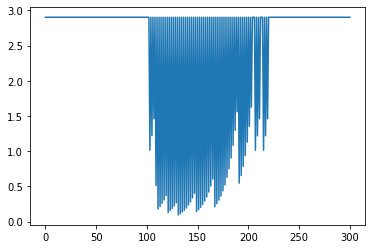

131Å


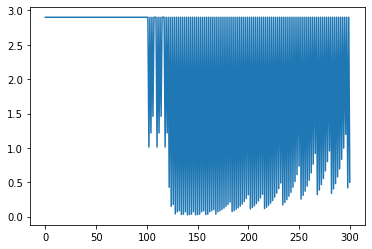

131Å


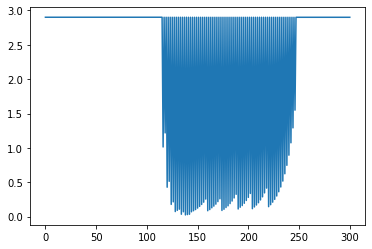

131Å


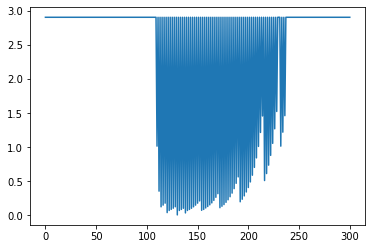

131Å


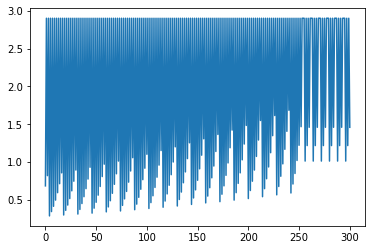

131Å


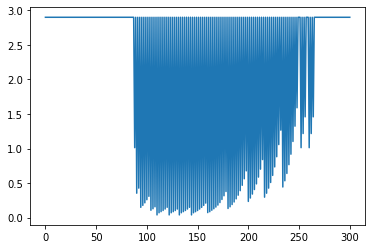

131Å


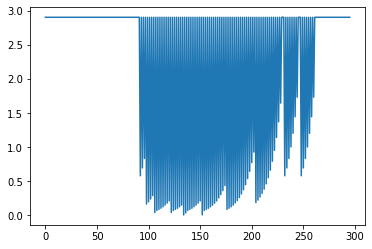

131Å


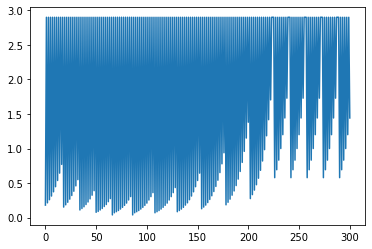

131Å


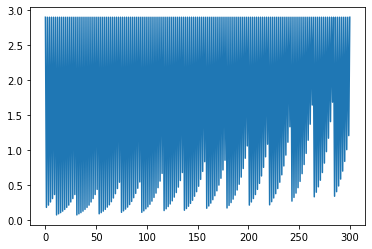

131Å


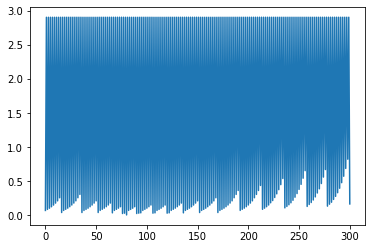

131Å


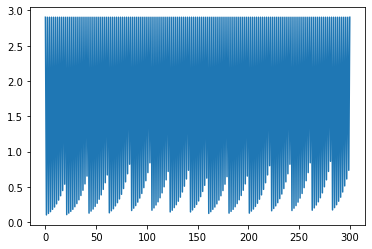

131Å


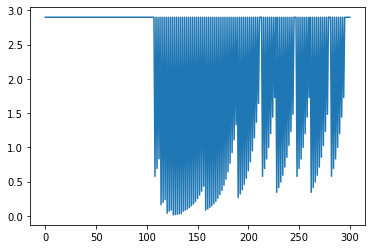

131Å


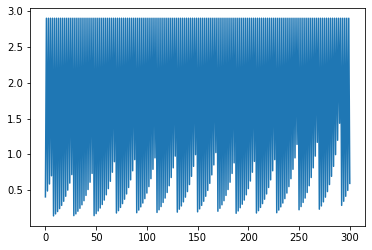

131Å


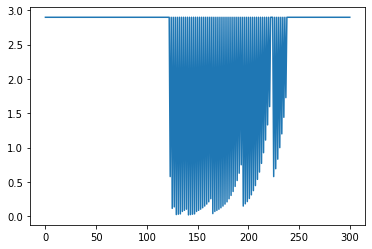

131Å


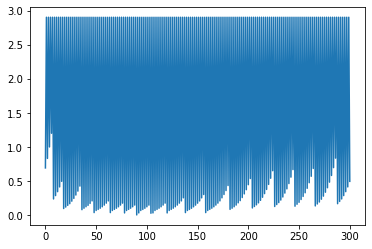

131Å


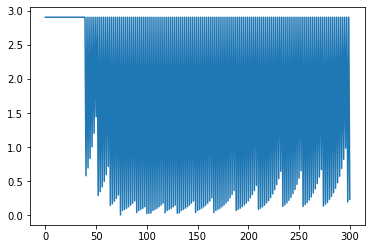

131Å


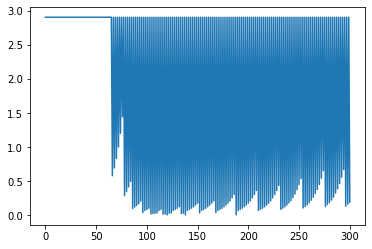

131Å


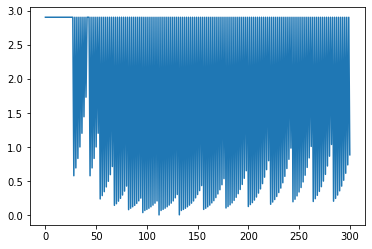

131Å


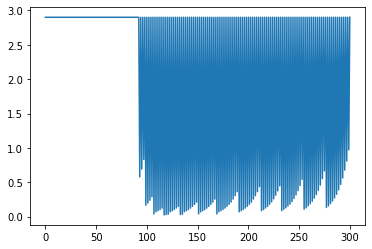

the max exposure times are [2.901363, 2.9014029999999997, 2.901361, 2.9013720000000003, 2.9013419999999996, 2.900874, 2.901381, 2.901338, 2.9012029999999998, 2.9012189999999998, 2.901247, 2.901247, 2.901236, 2.9012439999999997, 2.901327, 2.901402, 2.901369, 2.9013709999999997, 2.901381, 2.901355]
the min exposure times are [0.038918, 0.094541, 0.024311000000000003, 0.024353, 0.004869, 0.287581, 0.038932, 0.00485, 0.03884, 0.069746, 0.003711, 0.10263800000000001, 0.014573, 0.140704, 0.019452, 0.0048649999999999995, 0.004866, 0.004837, 0.004854, 0.024314]
out of 20 given flare times, 20 were able to be found at131Å
delta exps are[2.862445, 2.8068619999999997, 2.87705, 2.877019, 2.896473, 2.613293, 2.8624490000000002, 2.896488, 2.8623629999999998, 2.831473, 2.897536, 2.798609, 2.886663, 2.7605399999999998, 2.8818750000000004, 2.896537, 2.896503, 2.8965339999999995, 2.8965270000000003, 2.877041]
max finds are
20
The wavelegnth with the most discernable features was [171, 193, 211, 94, 131]

In [39]:
find_most_variance('X',class_flare,20,date)

304Å


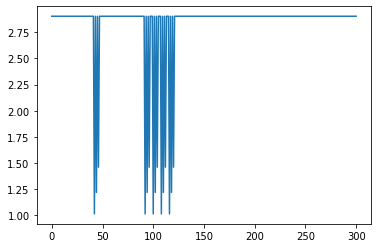

304Å


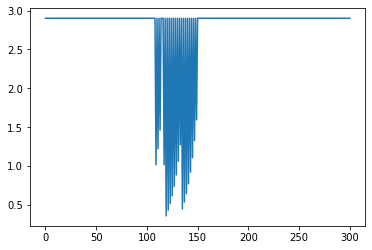

304Å


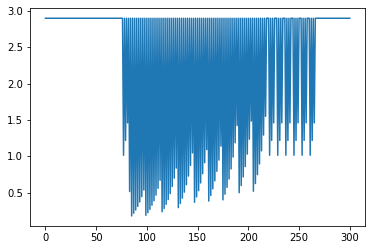

304Å


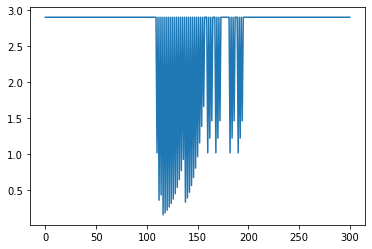

304Å


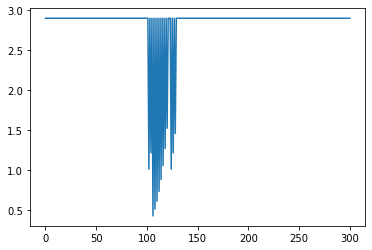

304Å


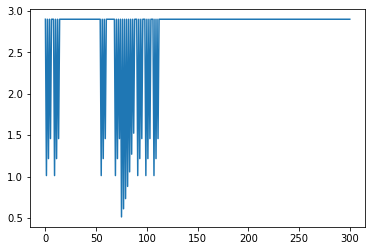

304Å


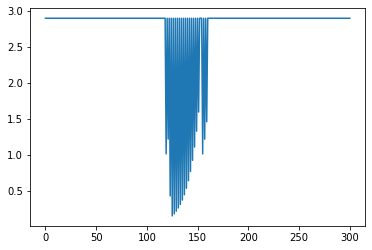

304Å


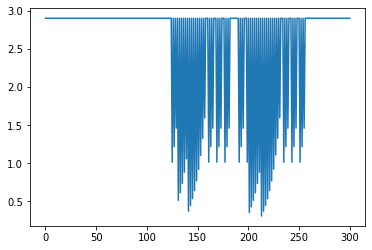

304Å


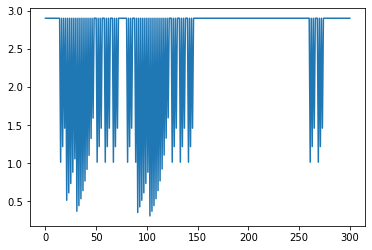

304Å


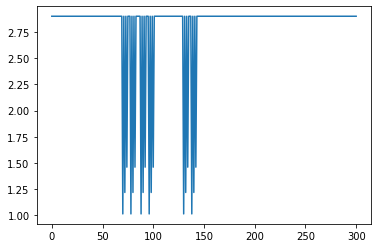

304Å


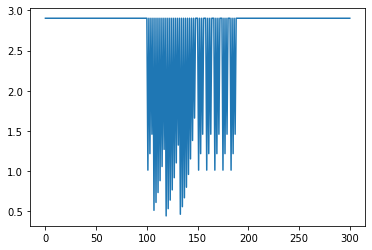

304Å


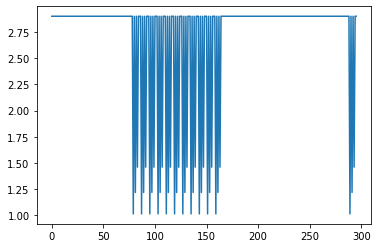

304Å


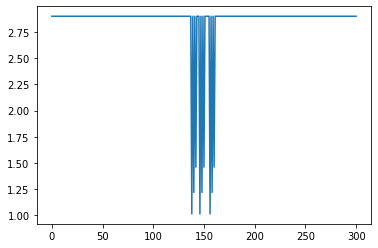

304Å


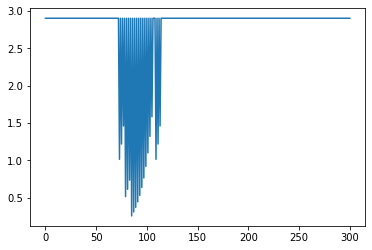

304Å


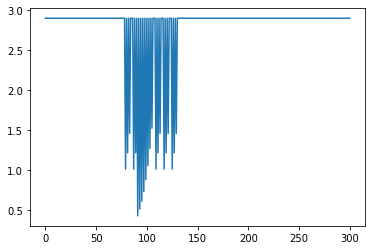

304Å


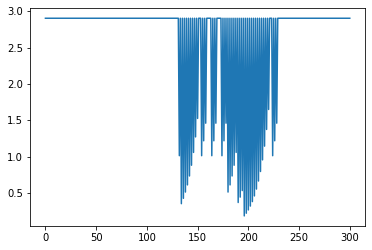

304Å


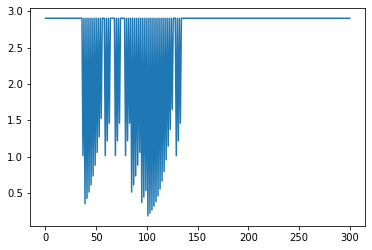

304Å


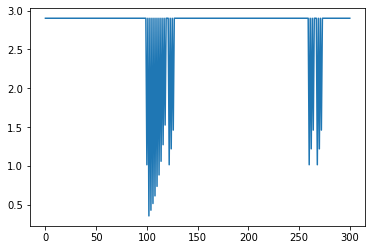

304Å


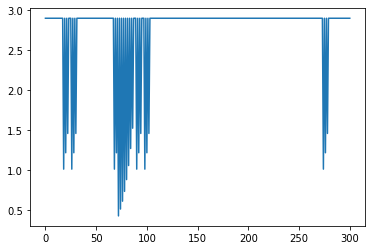

304Å


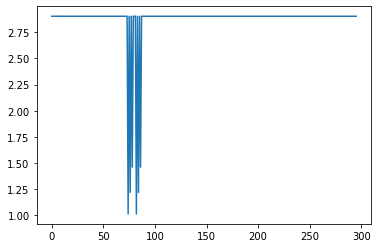

the max exposure times are [2.902231, 2.90216, 2.902199, 2.902232, 2.901107, 2.901105, 2.9011, 2.9011139999999997, 2.9011139999999997, 2.901056, 2.901055, 2.901079, 2.901107, 2.902229, 2.902221, 2.902221, 2.902221, 2.902203, 2.90223, 2.902216]
the min exposure times are [1.013685, 0.35441999999999996, 0.178291, 0.149601, 0.42702799999999996, 0.5130520000000001, 0.148623, 0.30825, 0.30825, 1.012589, 0.443413, 1.012549, 1.012594, 0.256135, 0.428159, 0.18651500000000001, 0.18651500000000001, 0.354423, 0.428216, 1.013698]
out of 20 given flare times, 20 were able to be found at304Å
delta exps are[1.888546, 2.54774, 2.7239079999999998, 2.752631, 2.474079, 2.3880529999999998, 2.752477, 2.5928639999999996, 2.5928639999999996, 1.8884670000000001, 2.457642, 1.8885300000000003, 1.888513, 2.646094, 2.474062, 2.715706, 2.715706, 2.54778, 2.474014, 1.8885180000000001]
171Å


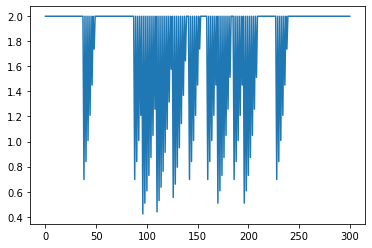

171Å


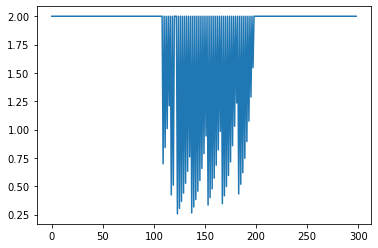

171Å


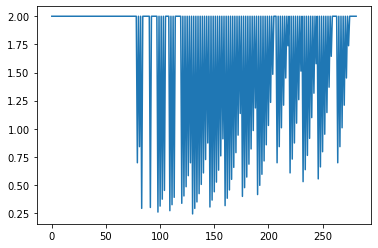

171Å


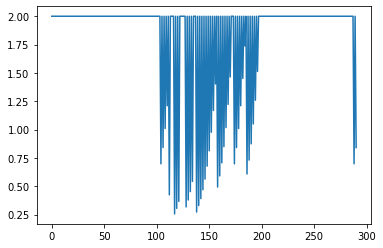

171Å


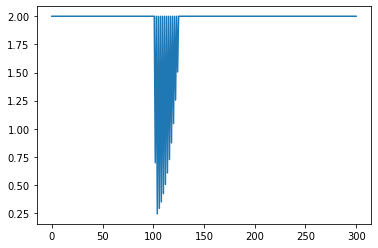

171Å


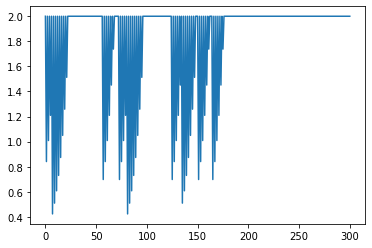

171Å


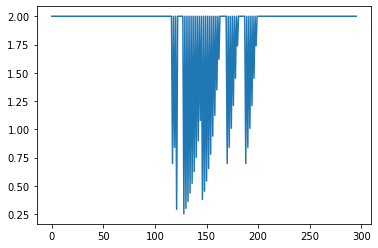

171Å


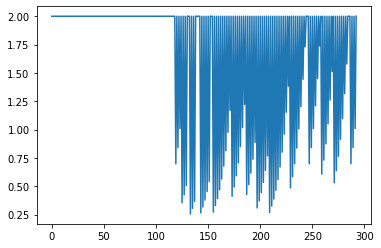

171Å


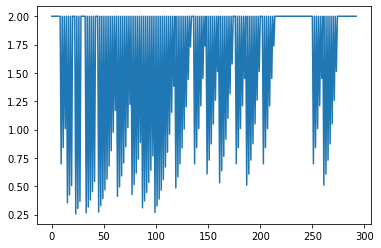

171Å


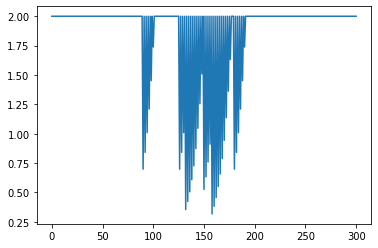

171Å


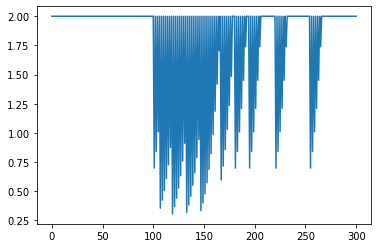

171Å


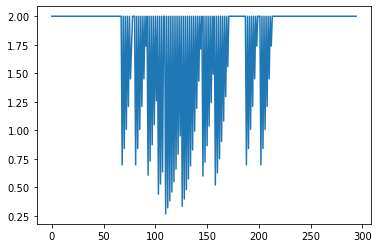

171Å


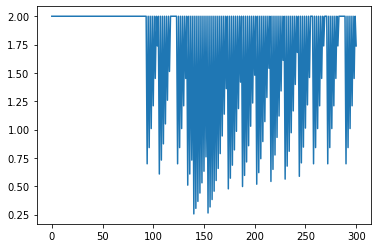

171Å


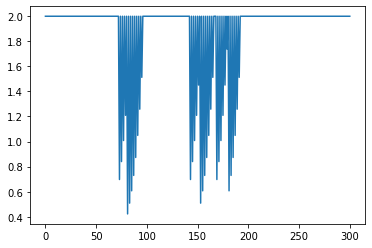

171Å


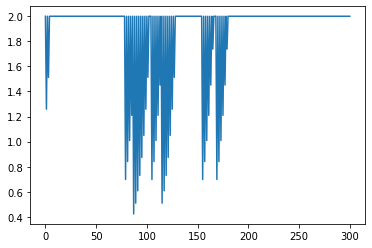

171Å


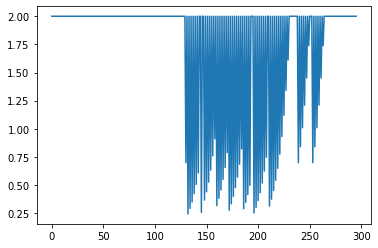

171Å


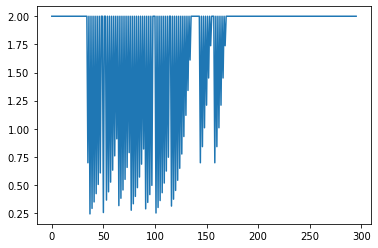

171Å


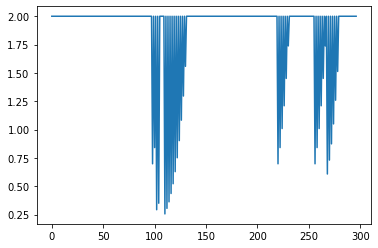

171Å


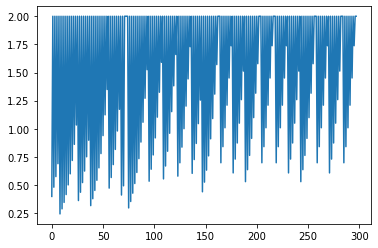

171Å


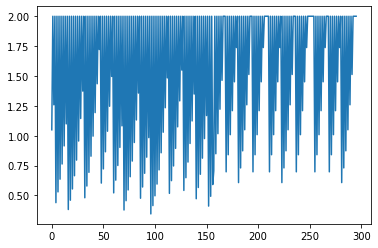

the max exposure times are [1.9996209999999999, 2.000229, 2.0002150000000003, 2.000205, 2.0002150000000003, 2.000218, 2.000211, 2.000229, 2.0002310000000003, 2.000214, 2.000228, 2.000213, 2.0002150000000003, 1.9996369999999999, 2.000216, 2.000211, 2.000206, 2.000229, 2.0002150000000003, 2.000216]
the min exposure times are [0.422649, 0.255299, 0.243006, 0.255288, 0.24301199999999998, 0.423246, 0.251204, 0.255304, 0.255304, 0.316749, 0.30445300000000003, 0.26757600000000004, 0.255292, 0.42263599999999996, 0.42323900000000003, 0.243013, 0.243013, 0.255302, 0.24301, 0.345406]
out of 20 given flare times, 20 were able to be found at171Å
delta exps are[1.5769719999999998, 1.74493, 1.7572090000000002, 1.7449169999999998, 1.7572030000000003, 1.5769719999999998, 1.7490070000000002, 1.744925, 1.7449270000000003, 1.6834650000000002, 1.6957749999999998, 1.732637, 1.7449230000000002, 1.5770009999999999, 1.5769769999999999, 1.7571980000000003, 1.757193, 1.7449270000000001, 1.7572050000000004, 1.654

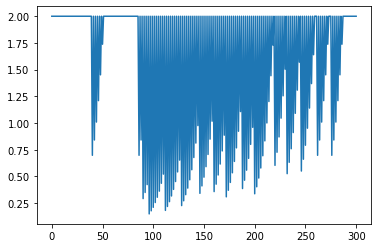

193Å


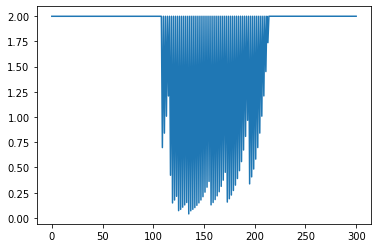

193Å


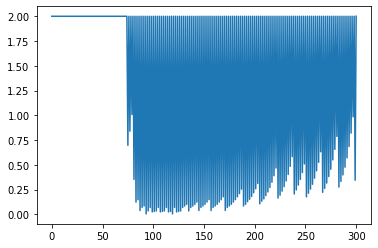

193Å


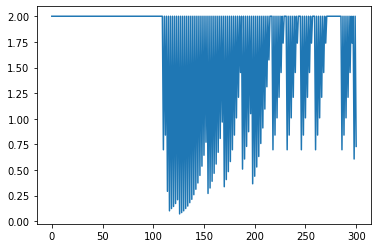

193Å


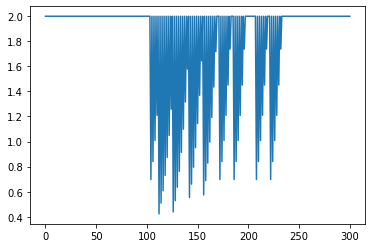

193Å


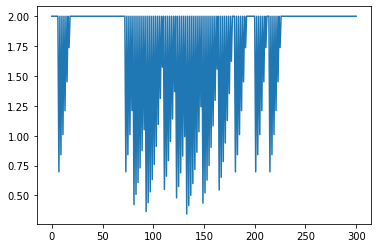

193Å


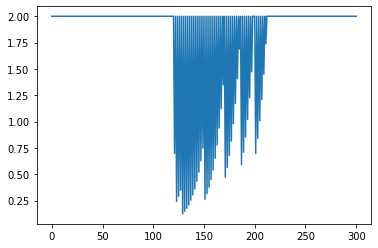

193Å


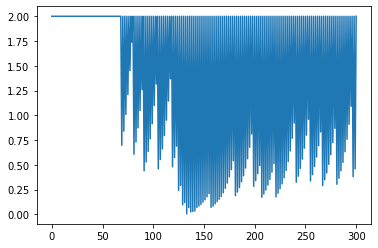

193Å


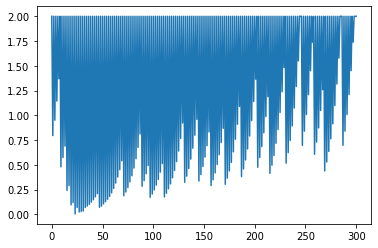

193Å


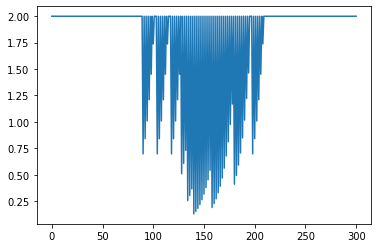

193Å


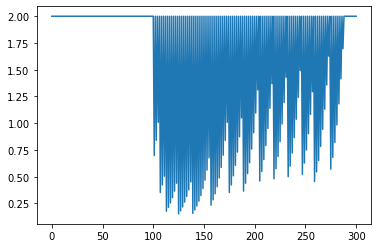

193Å


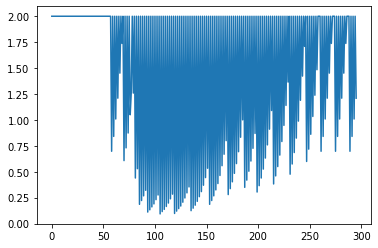

193Å


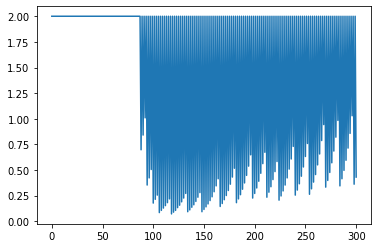

193Å


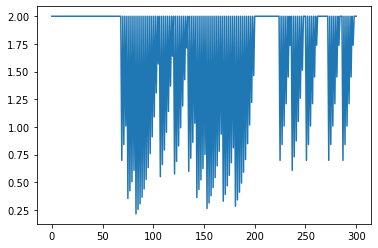

193Å


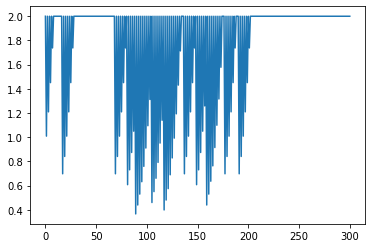

193Å


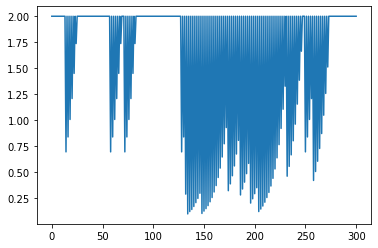

193Å


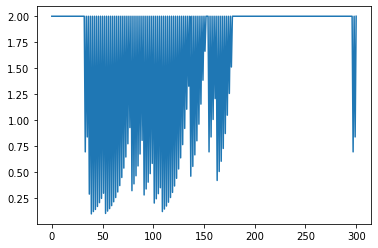

193Å


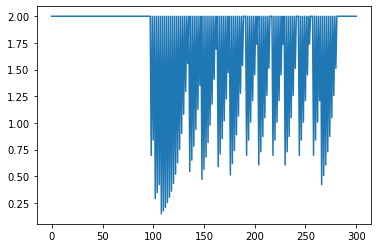

193Å


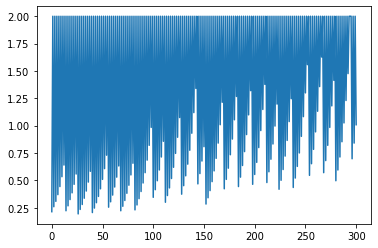

193Å


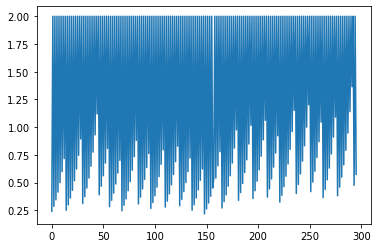

the max exposure times are [2.0000869999999997, 2.000095, 2.000095, 2.000092, 1.999685, 1.9996990000000001, 1.999681, 2.00009, 2.00009, 1.999707, 1.999689, 1.999668, 2.000102, 1.9996740000000002, 1.99968, 1.999679, 1.999679, 1.999675, 1.9996759999999998, 1.99967]
the min exposure times are [0.148569, 0.039243, 0.00489, 0.071903, 0.422713, 0.344885, 0.12404000000000001, 0.004889, 0.004889, 0.12846, 0.15221800000000002, 0.09275800000000001, 0.07191, 0.21379, 0.36536, 0.101386, 0.101386, 0.148128, 0.19331199999999998, 0.2179]
out of 20 given flare times, 20 were able to be found at193Å
delta exps are[1.8515179999999998, 1.960852, 1.995205, 1.928189, 1.576972, 1.654814, 1.8756410000000001, 1.9952010000000002, 1.9952010000000002, 1.8712469999999999, 1.847471, 1.9069099999999999, 1.9281920000000001, 1.7858840000000002, 1.6343199999999998, 1.898293, 1.898293, 1.851547, 1.8063639999999999, 1.78177]
211Å


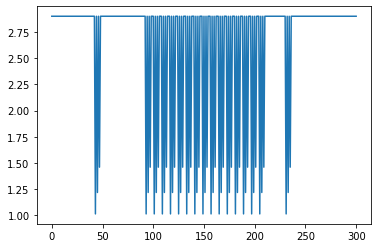

211Å


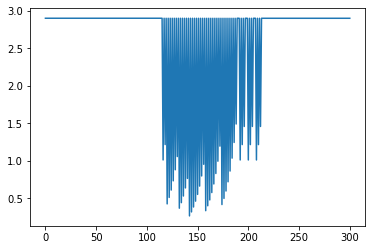

211Å


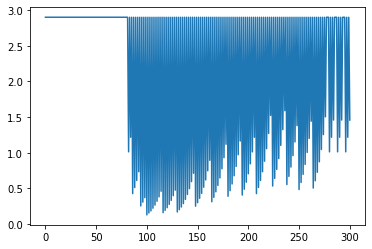

211Å


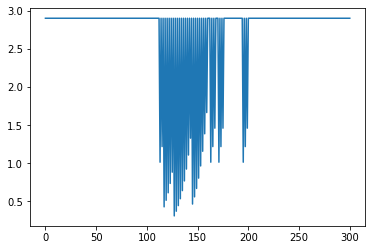

211Å


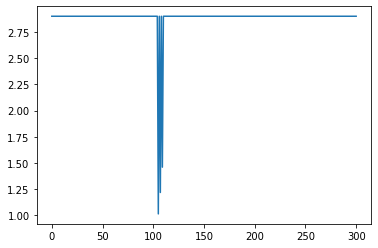

211Å


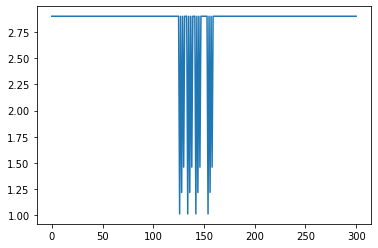

211Å


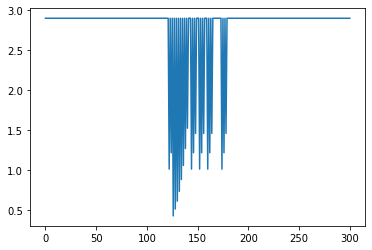

211Å


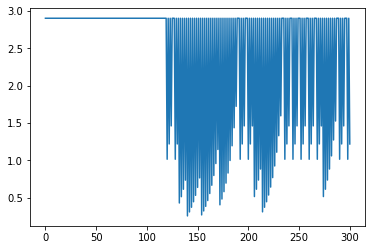

211Å


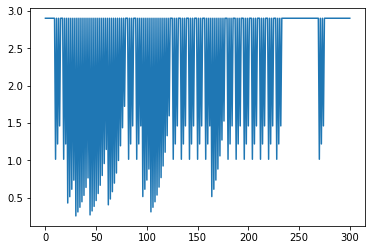

211Å


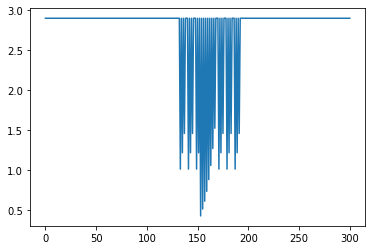

211Å


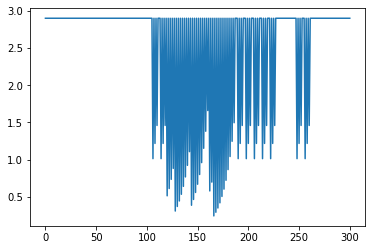

211Å


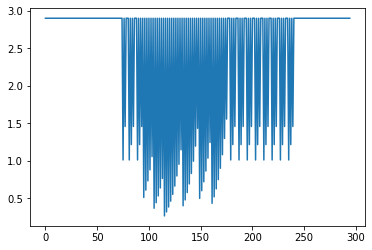

211Å


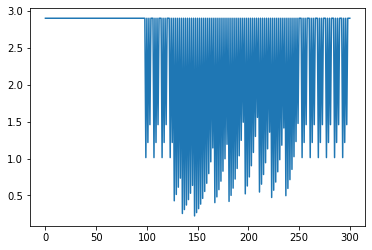

211Å


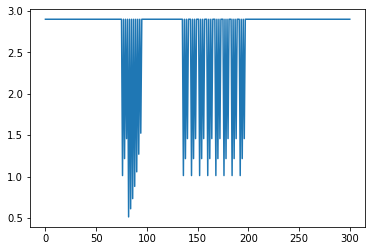

211Å


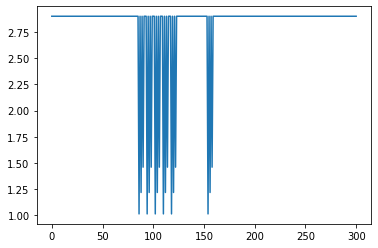

211Å


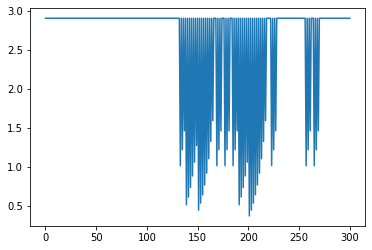

211Å


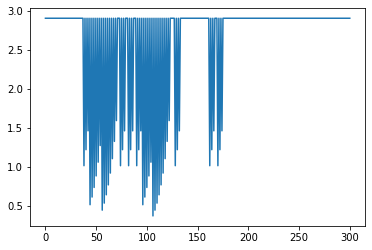

211Å


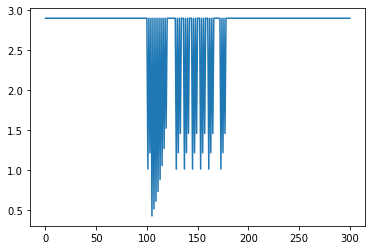

211Å


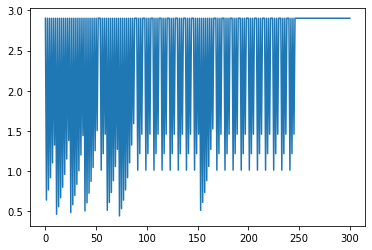

211Å


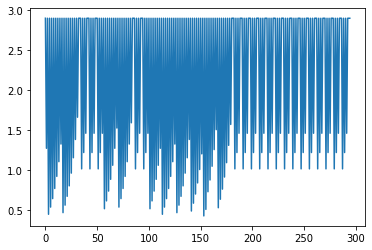

the max exposure times are [2.900846, 2.901236, 2.901242, 2.9008540000000003, 2.9012729999999998, 2.901278, 2.901278, 2.9012729999999998, 2.901277, 2.901288, 2.9012830000000003, 2.901251, 2.900855, 2.901271, 2.901265, 2.9012689999999997, 2.9012689999999997, 2.901272, 2.901271, 2.901243]
the min exposure times are [1.0125170000000001, 0.267044, 0.127857, 0.307998, 1.012952, 1.0129549999999998, 0.42722299999999996, 0.254152, 0.254152, 0.427227, 0.242902, 0.267479, 0.22199899999999997, 0.513232, 1.012946, 0.369869, 0.369869, 0.42721899999999996, 0.44360200000000005, 0.42311800000000005]
out of 20 given flare times, 20 were able to be found at211Å
delta exps are[1.888329, 2.634192, 2.7733849999999998, 2.5928560000000003, 1.8883209999999997, 1.8883230000000002, 2.474055, 2.647121, 2.647125, 2.474061, 2.6583810000000003, 2.6337719999999996, 2.678856, 2.388039, 1.888319, 2.5313999999999997, 2.5313999999999997, 2.474053, 2.457669, 2.478125]
335Å


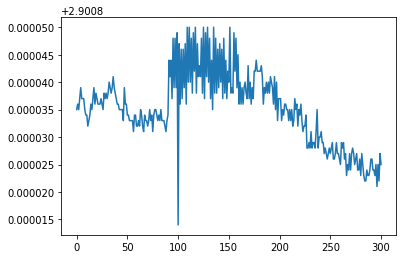

335Å


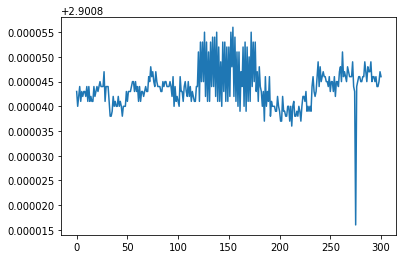

335Å


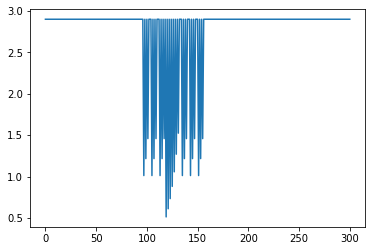

335Å


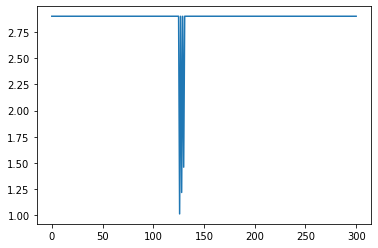

335Å


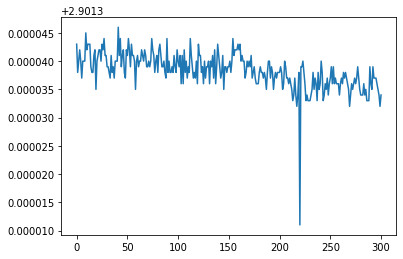

335Å


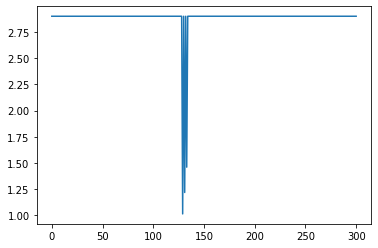

335Å


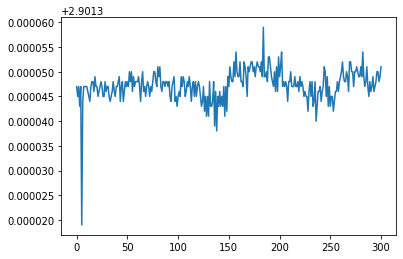

335Å


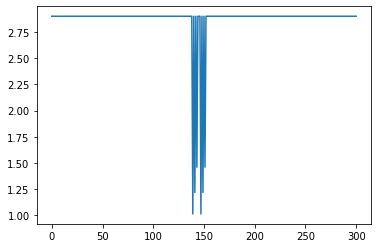

335Å


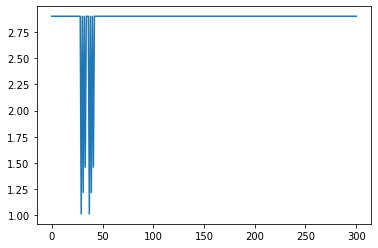

335Å


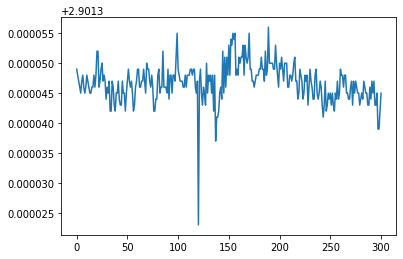

335Å


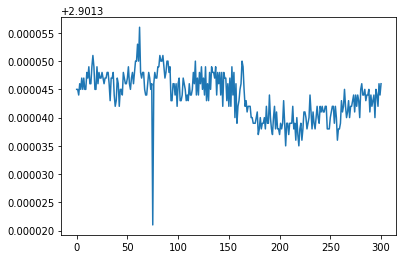

335Å


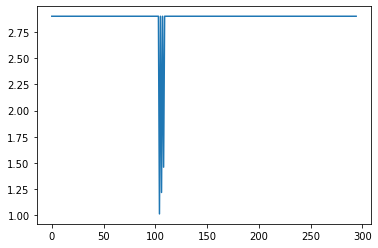

335Å


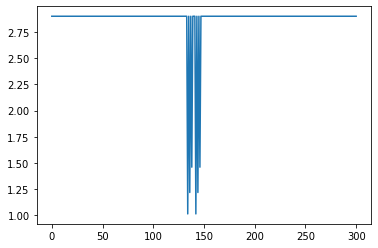

335Å


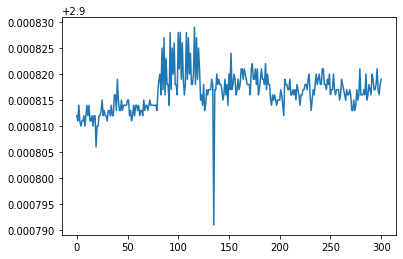

335Å


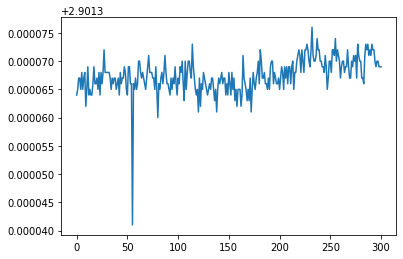

335Å


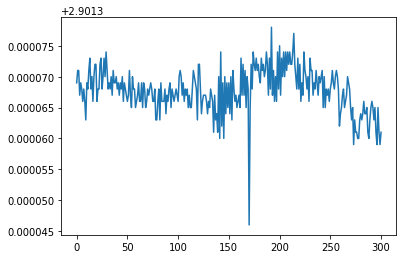

335Å


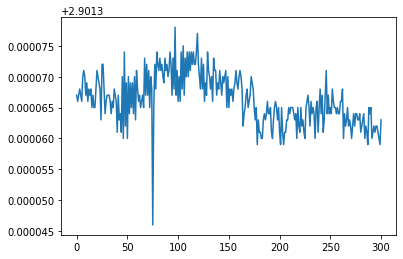

335Å


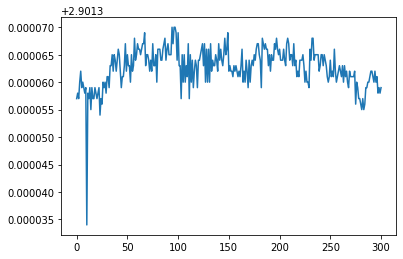

335Å


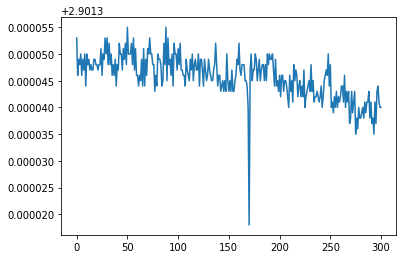

335Å


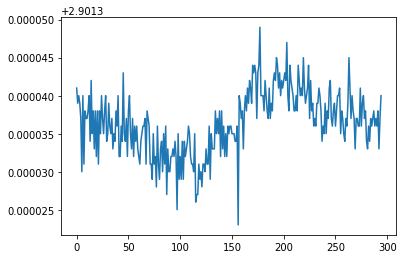

the max exposure times are [2.9008380000000002, 2.900839, 2.901365, 2.901378, 2.901378, 2.9013400000000003, 2.901383]
the min exposure times are [0.512813, 1.012538, 1.013072, 1.013083, 1.013083, 1.013044, 1.013083]
out of 20 given flare times, 7 were able to be found at335Å
delta exps are[2.3880250000000003, 1.888301, 1.8882930000000002, 1.8882949999999998, 1.8882949999999998, 1.8882960000000002, 1.8883]
94Å


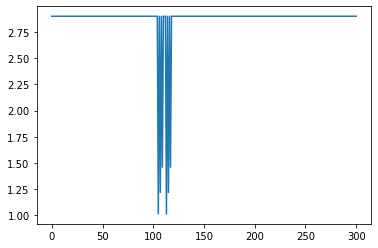

94Å


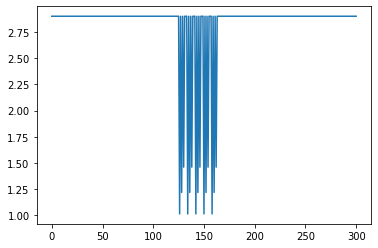

94Å


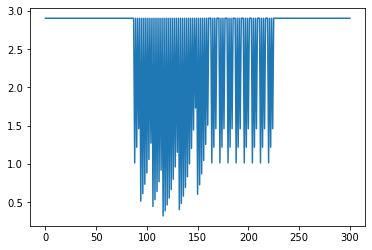

94Å


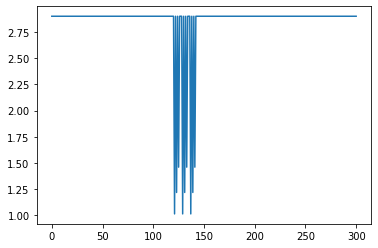

94Å


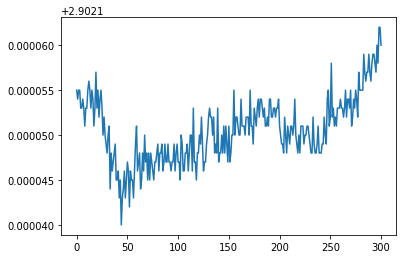

94Å


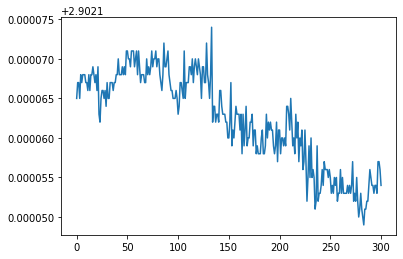

94Å


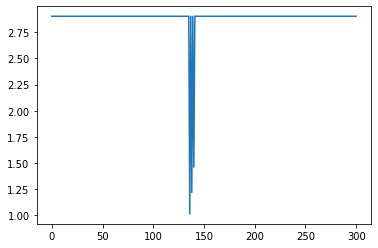

94Å


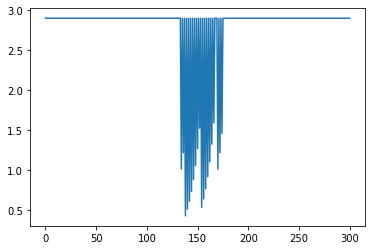

94Å


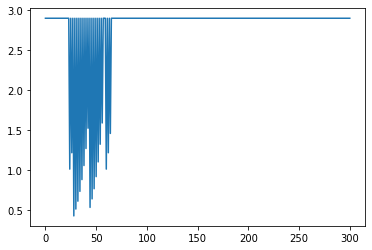

94Å


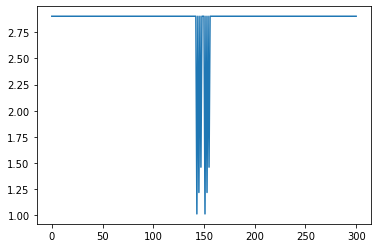

94Å


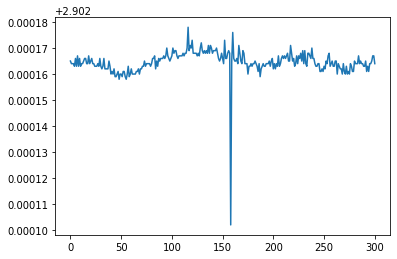

94Å


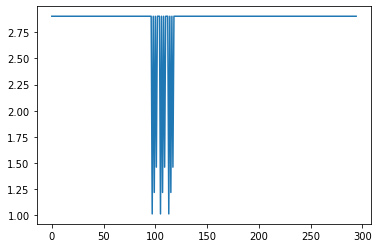

94Å


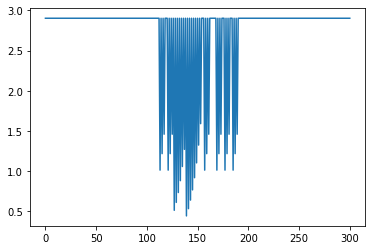

94Å


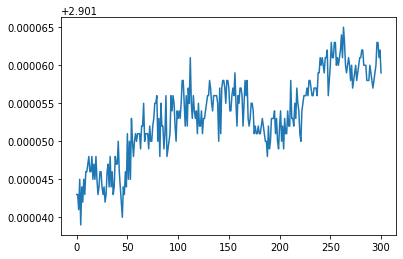

94Å


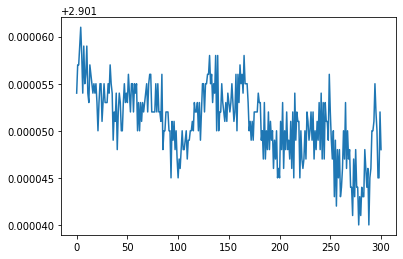

94Å


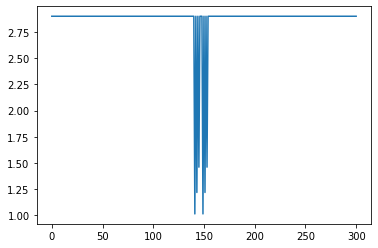

94Å


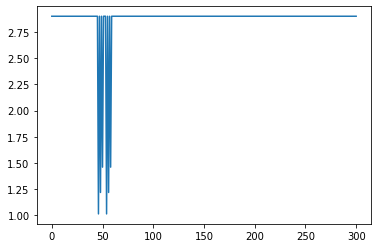

94Å


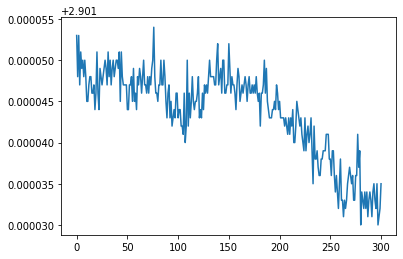

94Å


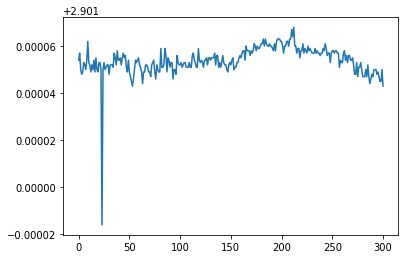

94Å


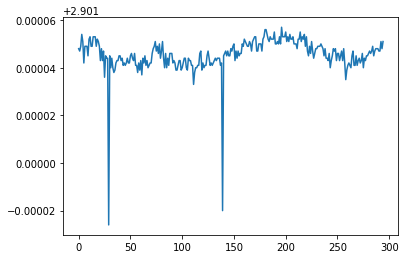

the max exposure times are [2.901061, 2.901051, 2.901073, 2.901102, 2.902186, 2.9022069999999998, 2.9022069999999998, 2.902176, 2.9021790000000003, 2.902192, 2.901046, 2.901047]
the min exposure times are [1.012592, 1.0125879999999998, 0.320521, 1.012594, 1.013727, 0.428163, 0.428163, 1.013716, 1.013694, 0.444533, 1.012586, 1.012586]
out of 20 given flare times, 12 were able to be found at94Å
delta exps are[1.888469, 1.888463, 2.580552, 1.8885079999999999, 1.8884589999999999, 2.4740439999999997, 2.4740439999999997, 1.8884599999999998, 1.8884850000000002, 2.457659, 1.88846, 1.8884610000000002]
131Å


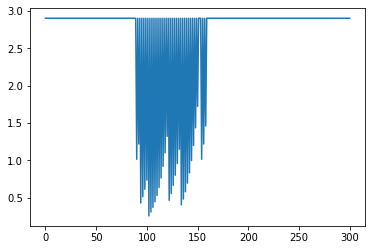

131Å


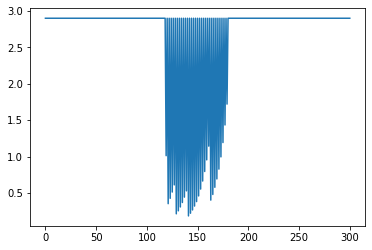

131Å


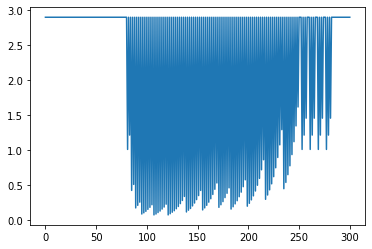

131Å


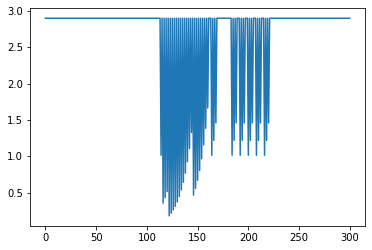

131Å


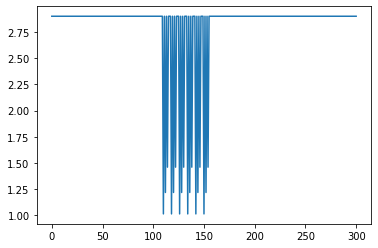

131Å


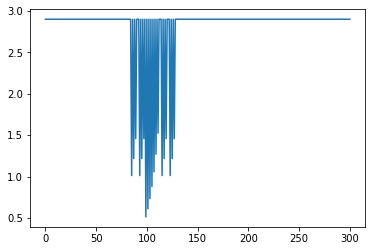

131Å


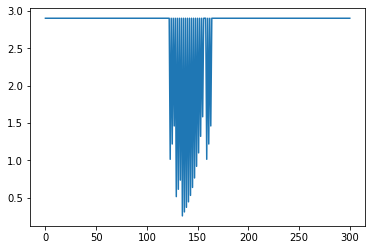

131Å


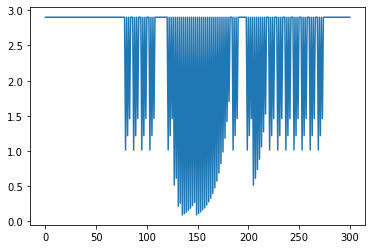

131Å


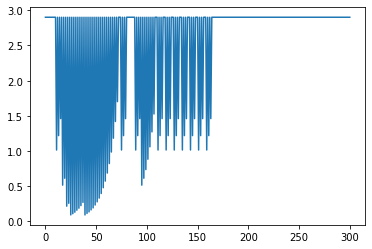

131Å


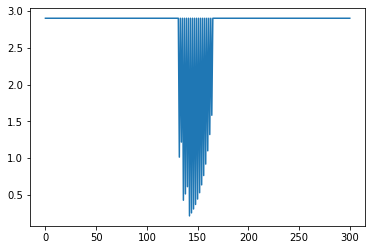

131Å


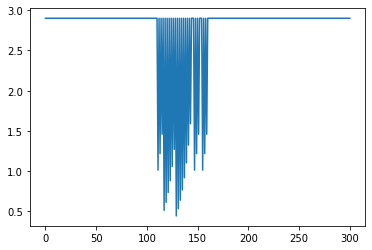

131Å


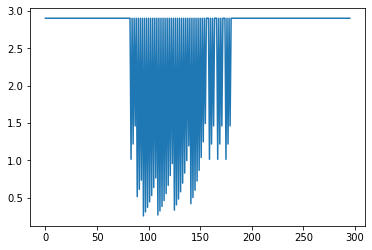

131Å


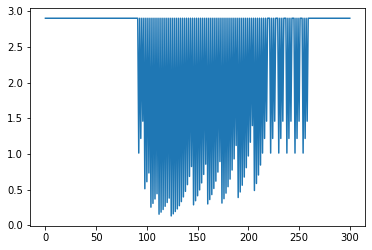

131Å


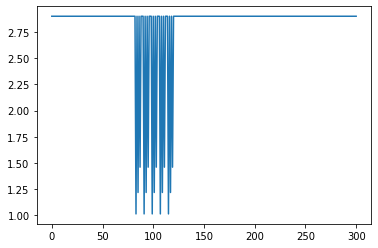

131Å


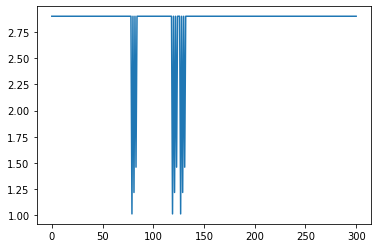

131Å


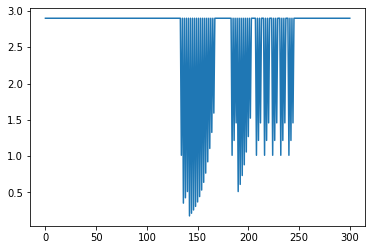

131Å


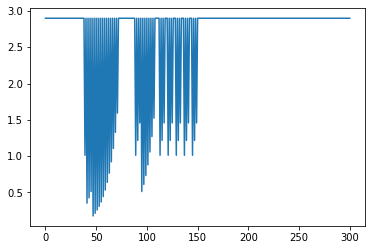

131Å


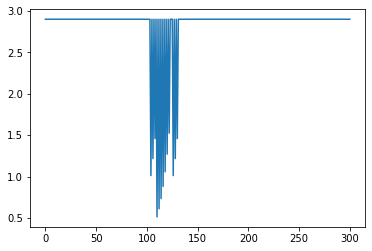

131Å


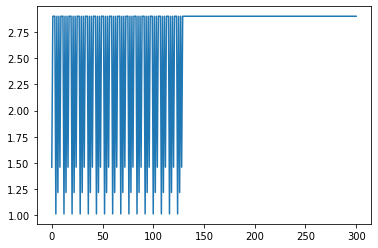

131Å


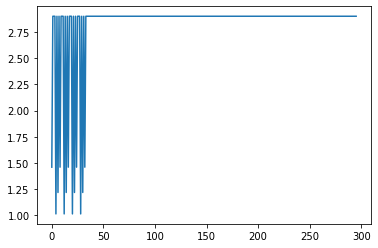

the max exposure times are [2.901376, 2.901378, 2.901355, 2.901402, 2.900837, 2.9008540000000003, 2.900857, 2.900865, 2.900874, 2.900863, 2.900881, 2.900862, 2.900856, 2.901373, 2.900864, 2.900861, 2.900861, 2.900864, 2.90088, 2.900882]
the min exposure times are [0.255274, 0.185683, 0.07740599999999999, 0.17744200000000002, 1.012529, 0.512758, 0.254782, 0.089422, 0.089422, 0.213829, 0.443204, 0.254779, 0.13213, 1.013052, 1.012549, 0.176939, 0.176939, 0.512837, 1.012548, 1.012541]
out of 20 given flare times, 20 were able to be found at131Å
delta exps are[2.646102, 2.7156949999999997, 2.8239490000000003, 2.72396, 1.888308, 2.388096, 2.6460749999999997, 2.811443, 2.811452, 2.687034, 2.457677, 2.646083, 2.768726, 1.888321, 1.888315, 2.723922, 2.723922, 2.388027, 1.888332, 1.8883410000000003]
max finds are
20
The wavelegnth with the most discernable features was [304, 171, 193, 211, 131]Å
The wavelength with the highest average delta exposure was 131Å


In [38]:
find_most_variance('M',class_flare,20,date)

304Å


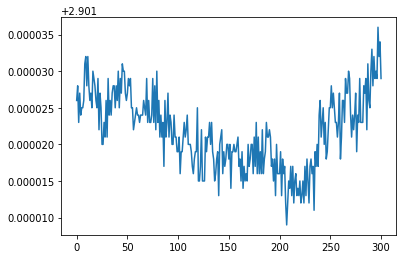

304Å


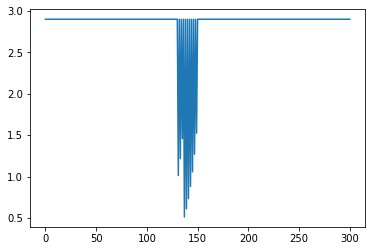

304Å


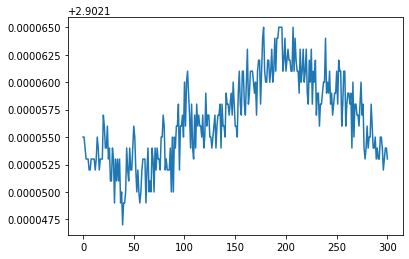

304Å


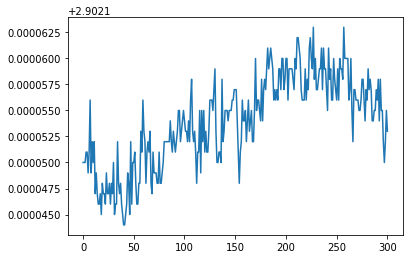

304Å


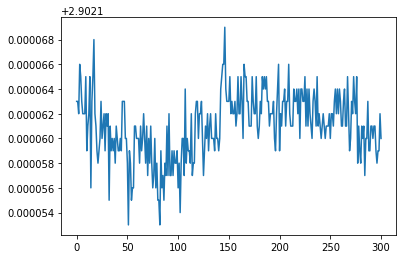

304Å


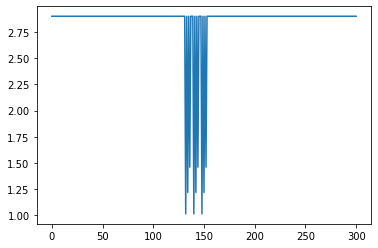

304Å


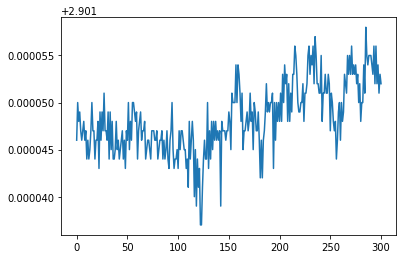

304Å


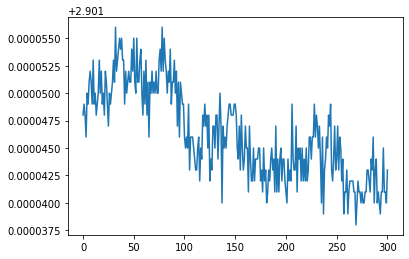

304Å


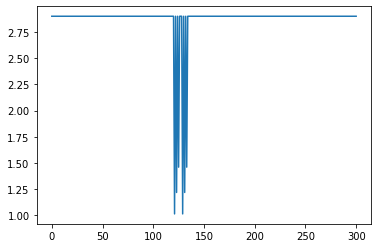

304Å


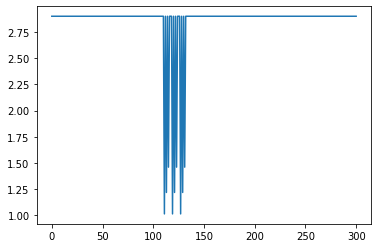

304Å


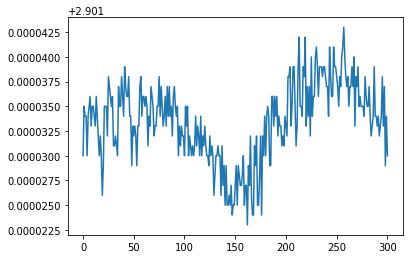

304Å


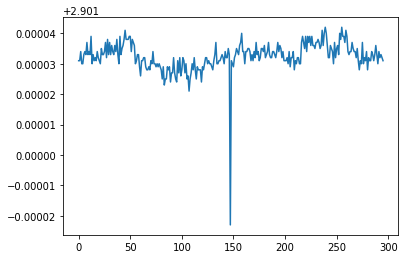

304Å


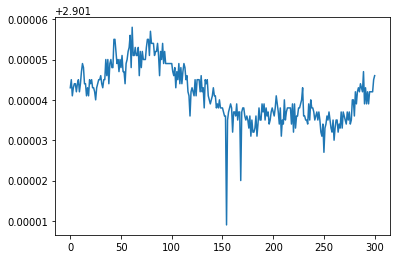

304Å


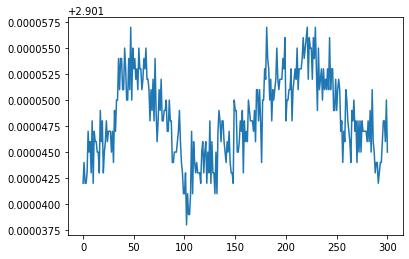

304Å


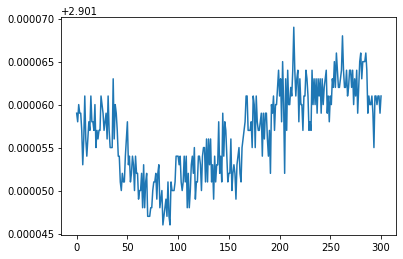

304Å


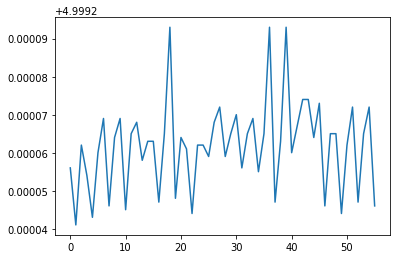

304Å


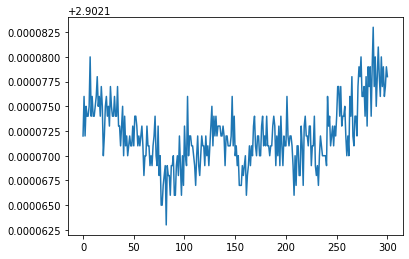

304Å


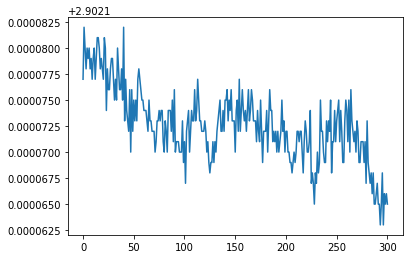

304Å


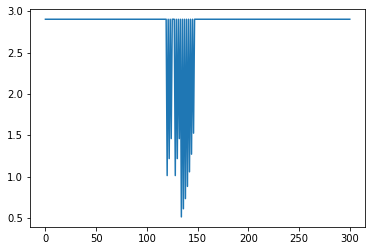

304Å


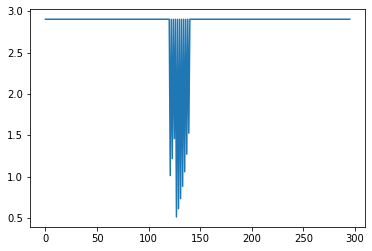

the max exposure times are [2.9010540000000002, 2.901104, 2.901049, 2.901103, 2.902155, 2.902199]
the min exposure times are [0.513053, 1.012593, 1.012586, 1.012584, 0.514153, 0.514155]
out of 20 given flare times, 6 were able to be found at304Å
delta exps are[2.388001, 1.888511, 1.888463, 1.888519, 2.388002, 2.388044]
171Å


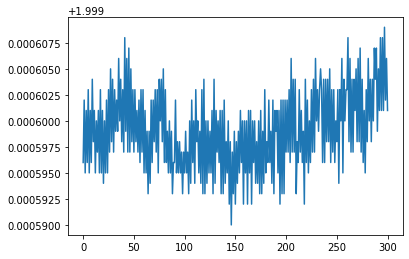

171Å


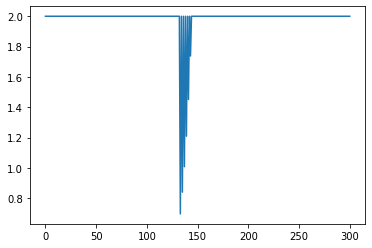

171Å


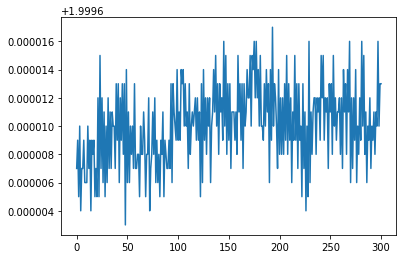

171Å


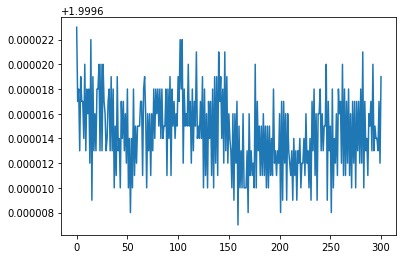

171Å


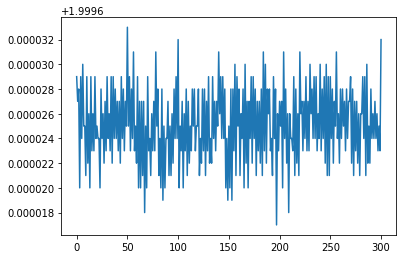

171Å


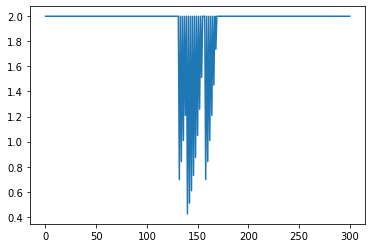

171Å


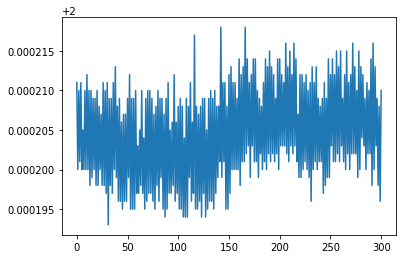

171Å


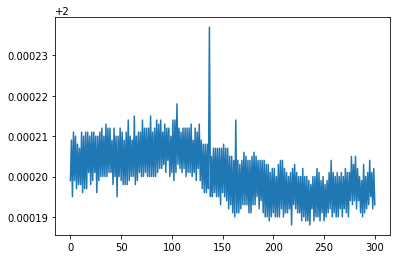

171Å


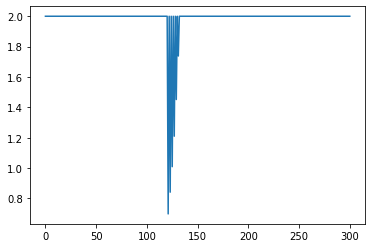

171Å


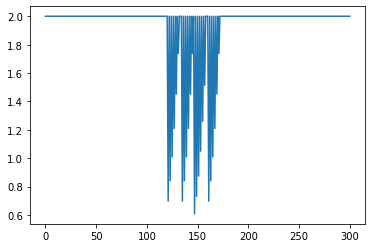

171Å


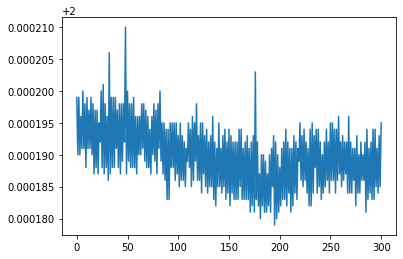

171Å


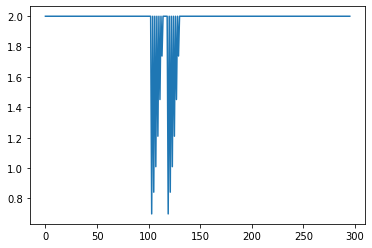

171Å


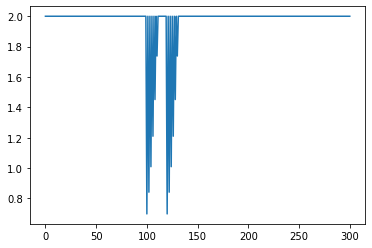

171Å


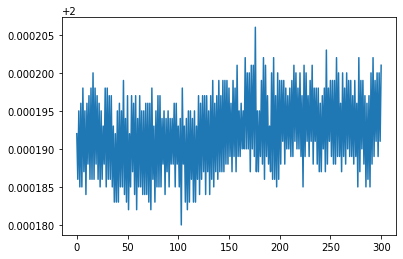

171Å


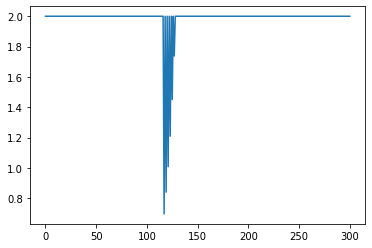

171Å


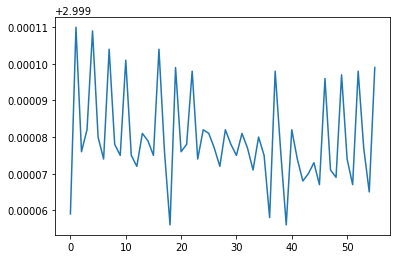

171Å


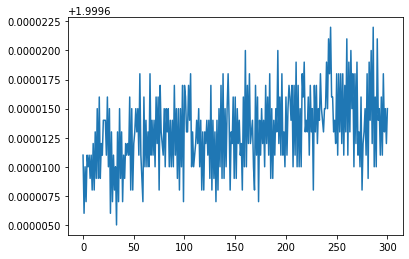

171Å


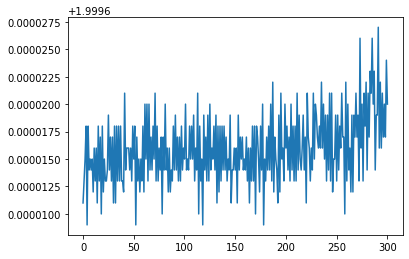

171Å


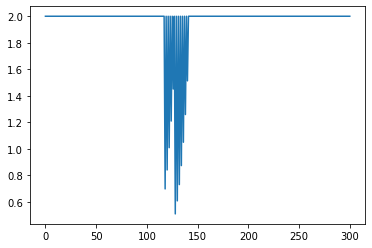

171Å


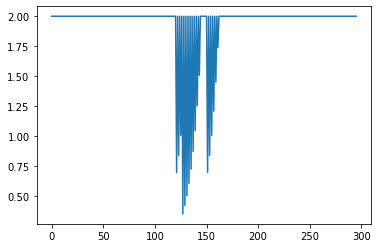

the max exposure times are [1.999626, 2.000208, 2.000207, 2.000208, 2.000219, 2.000234, 1.9996369999999999, 2.000204, 2.000223]
the min exposure times are [0.697071, 0.42323599999999995, 0.6976720000000001, 0.607592, 0.6976600000000001, 0.697675, 0.6970970000000001, 0.509257, 0.353601]
out of 20 given flare times, 9 were able to be found at171Å
delta exps are[1.302555, 1.5769720000000003, 1.302535, 1.3926160000000003, 1.302559, 1.3025589999999998, 1.3025399999999998, 1.4909470000000002, 1.646622]
193Å


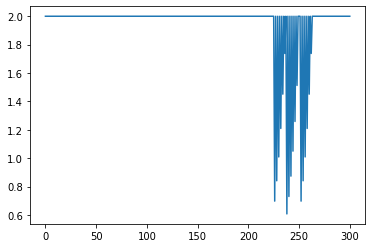

193Å


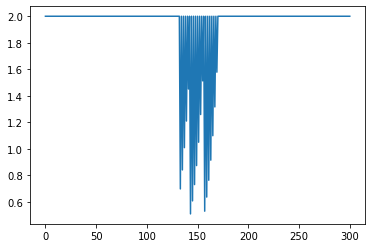

193Å


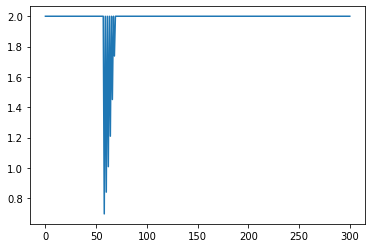

193Å


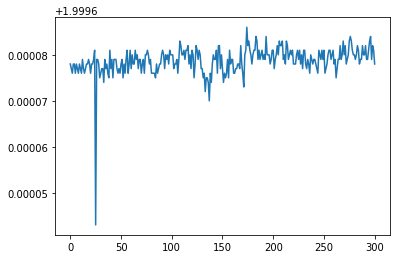

193Å


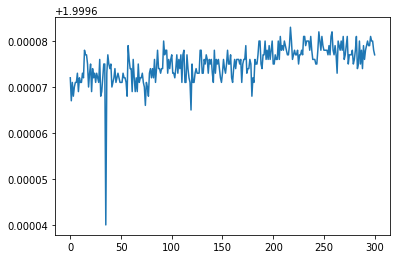

193Å


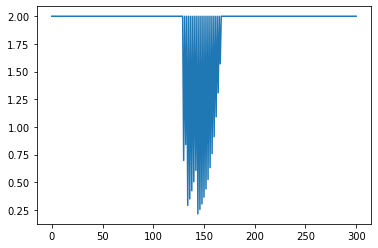

193Å


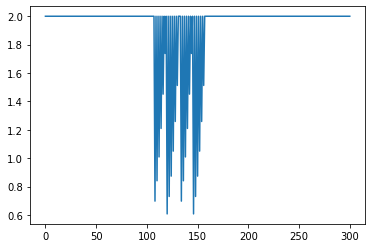

193Å


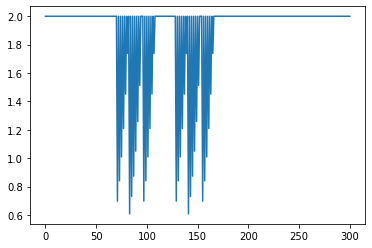

193Å


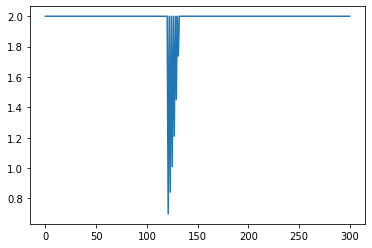

193Å


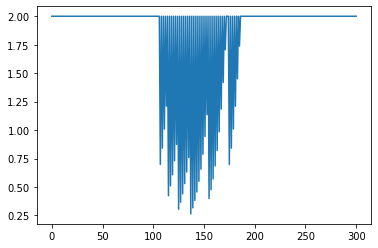

193Å


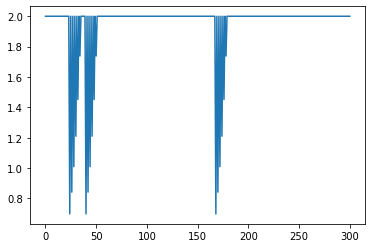

193Å


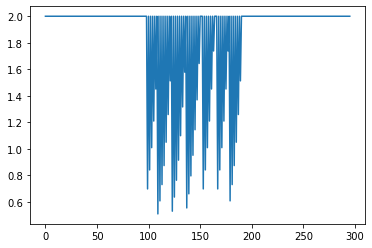

193Å


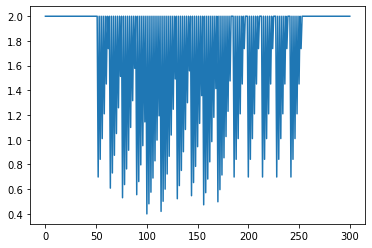

193Å


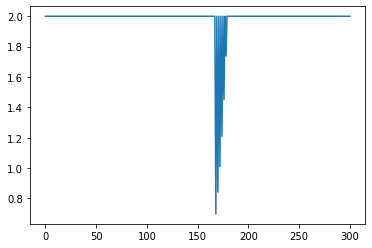

193Å


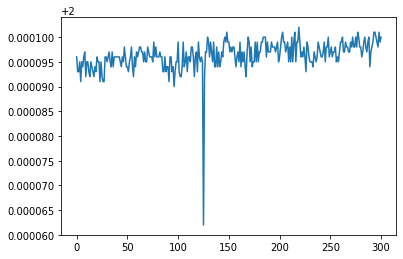

193Å


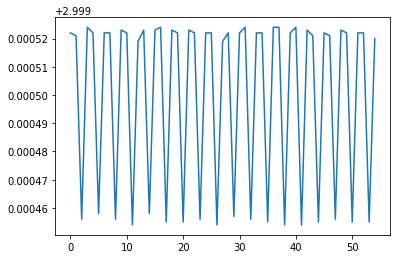

193Å


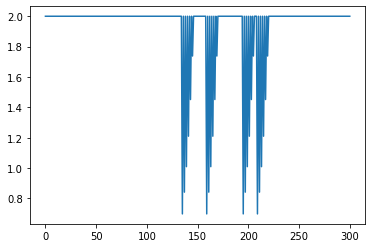

193Å


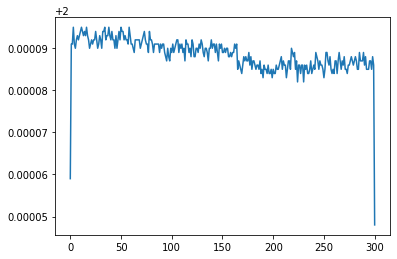

193Å


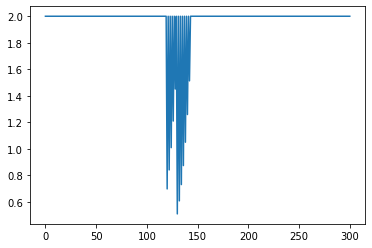

193Å


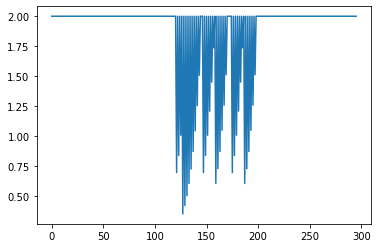

the max exposure times are [1.9996759999999998, 1.999675, 1.999684, 2.000102, 2.000106, 2.000106, 2.0001189999999998, 2.000107, 2.000104, 2.000102, 2.00011, 2.000099, 2.0000970000000002, 1.9996909999999999, 1.999669]
the min exposure times are [0.60702, 0.508716, 0.697141, 0.21424899999999997, 0.60745, 0.607453, 0.697567, 0.263388, 0.6975600000000001, 0.509139, 0.39855799999999997, 0.697561, 0.697555, 0.5087109999999999, 0.353058]
out of 20 given flare times, 15 were able to be found at193Å
delta exps are[1.3926559999999997, 1.4909590000000001, 1.302543, 1.7858530000000001, 1.3926560000000001, 1.3926530000000001, 1.3025519999999997, 1.736719, 1.3025439999999997, 1.490963, 1.6015519999999999, 1.3025380000000002, 1.3025420000000003, 1.49098, 1.646611]
211Å


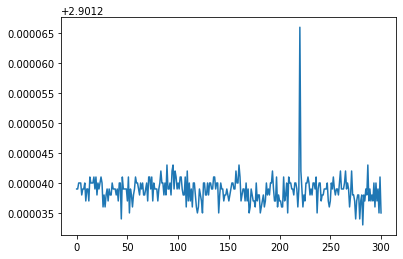

211Å


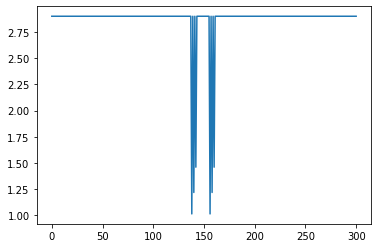

211Å


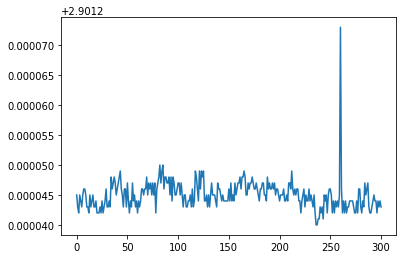

211Å


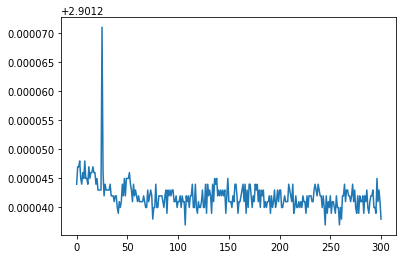

211Å


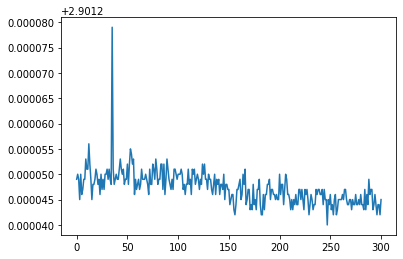

211Å


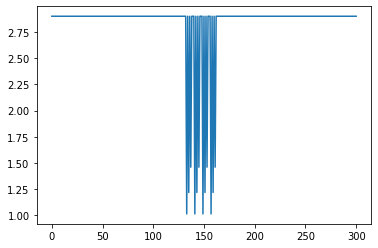

211Å


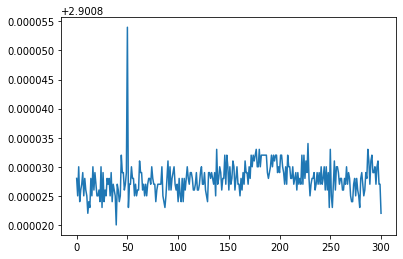

211Å


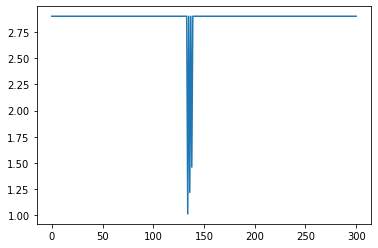

211Å


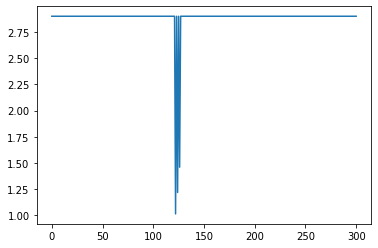

211Å


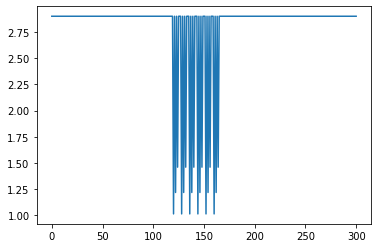

211Å


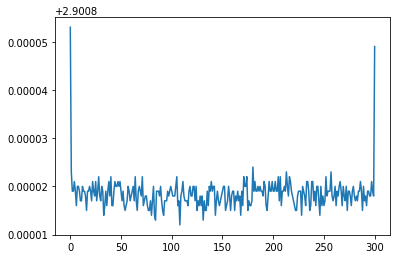

211Å


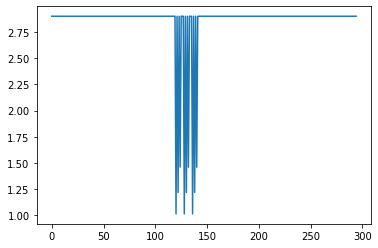

211Å


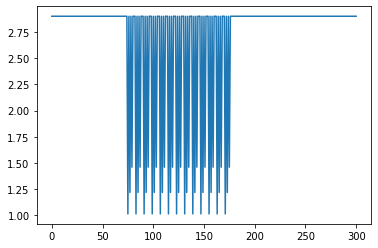

211Å


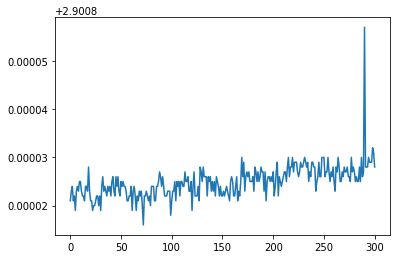

211Å


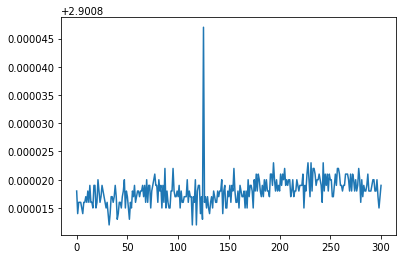

211Å


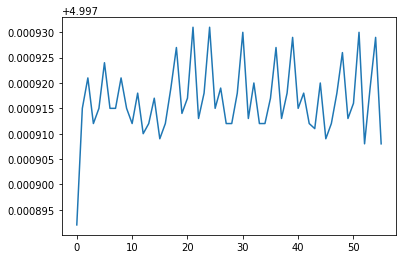

211Å


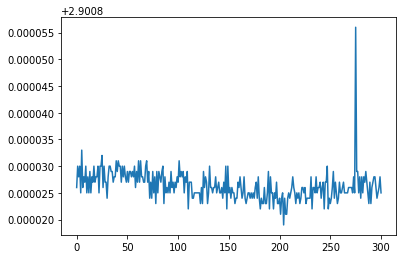

211Å


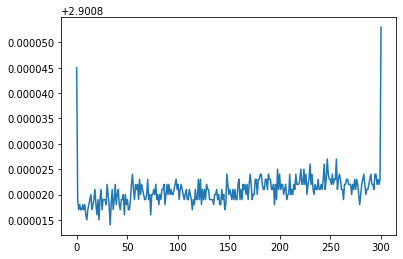

211Å


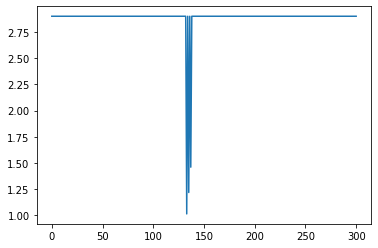

211Å


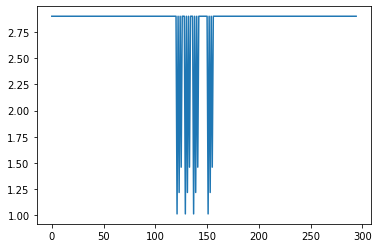

the max exposure times are [2.901272, 2.9008540000000003, 2.900855, 2.900855, 2.9008580000000004, 2.900825, 2.900859, 2.901265, 2.901236]
the min exposure times are [1.01295, 1.012522, 1.012534, 1.01253, 1.01253, 1.012525, 1.012526, 1.012944, 1.012939]
out of 20 given flare times, 9 were able to be found at211Å
delta exps are[1.888322, 1.8883320000000003, 1.888321, 1.888325, 1.8883280000000005, 1.8883000000000003, 1.888333, 1.888321, 1.888297]
335Å


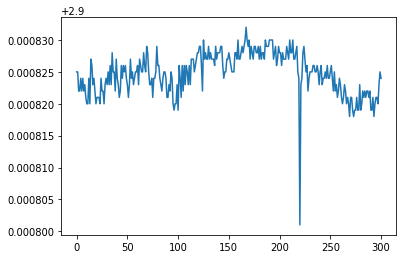

335Å


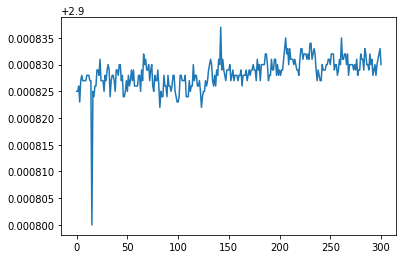

335Å


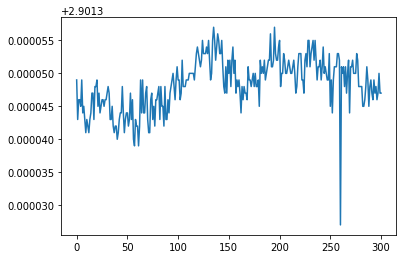

335Å


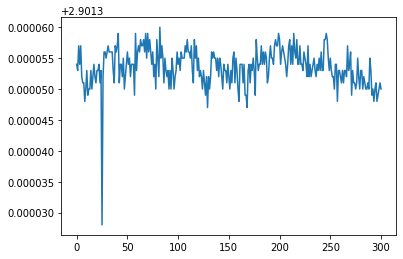

335Å


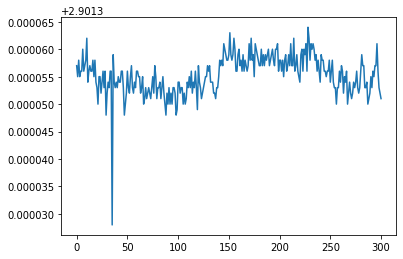

335Å


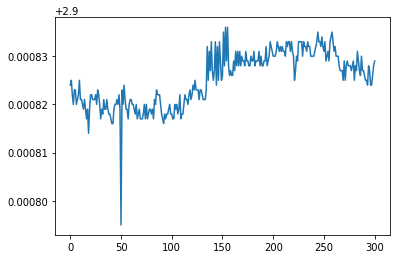

335Å


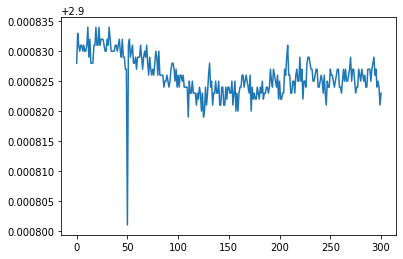

335Å


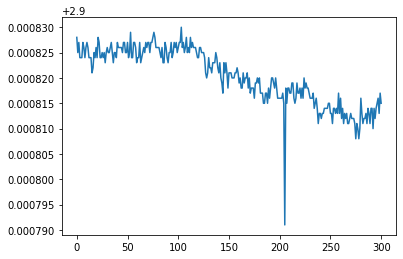

335Å


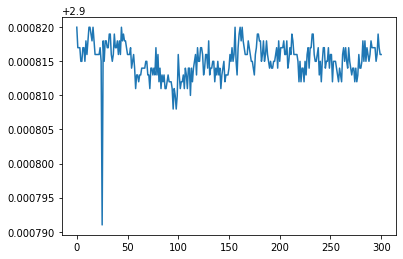

335Å


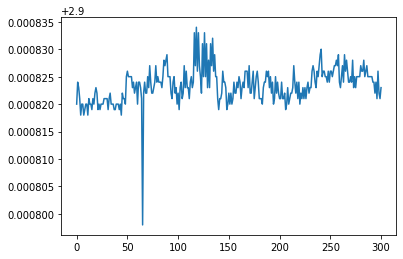

335Å


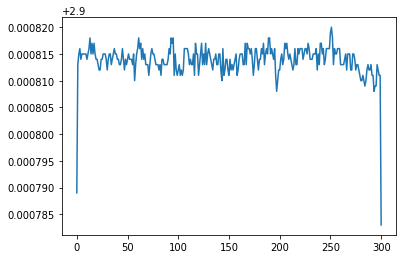

335Å


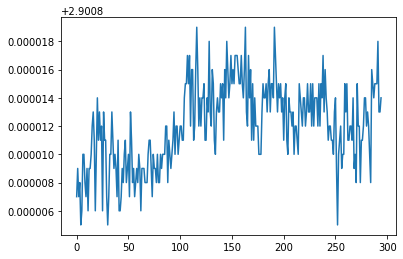

335Å


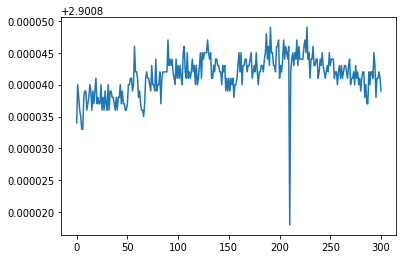

335Å


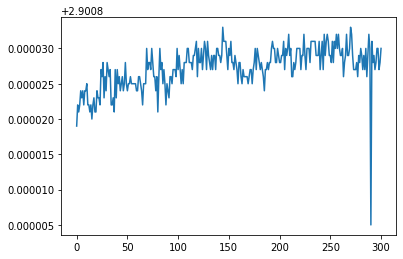

335Å


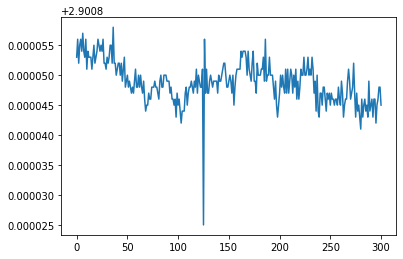

335Å


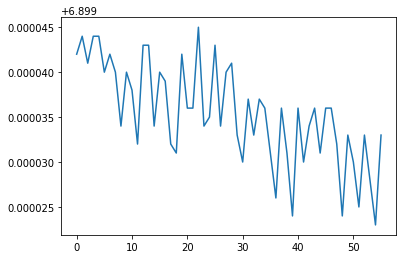

335Å


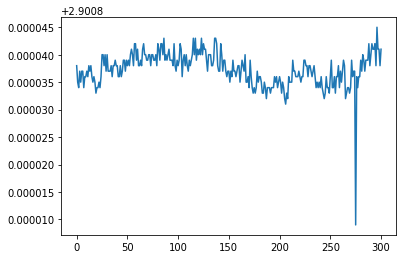

335Å


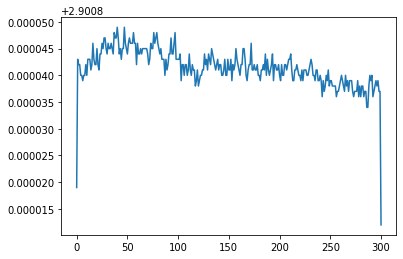

335Å


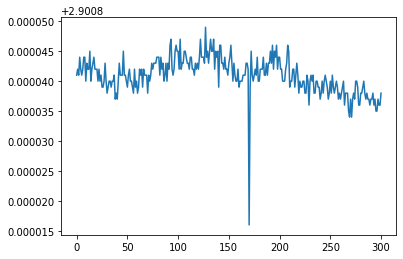

335Å


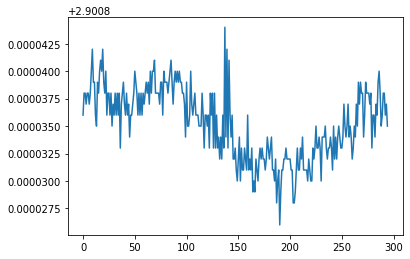

the max exposure times are []
the min exposure times are []
out of 20 given flare times, 0 were able to be found at335Å
delta exps are[]
94Å


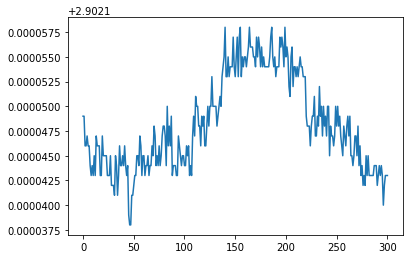

94Å


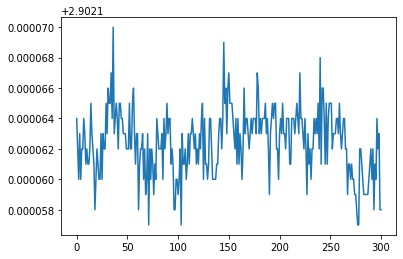

94Å


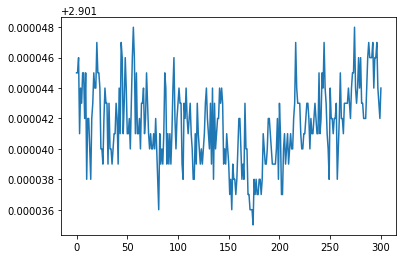

94Å


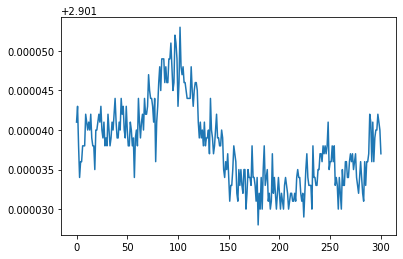

94Å


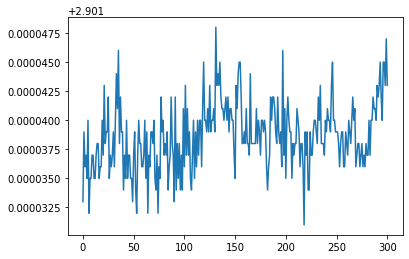

94Å


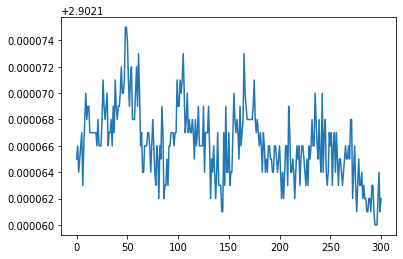

94Å


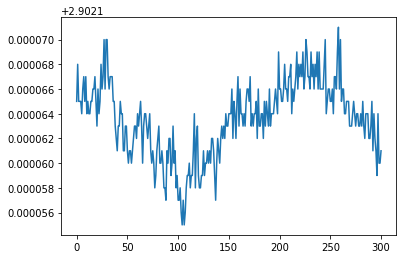

94Å


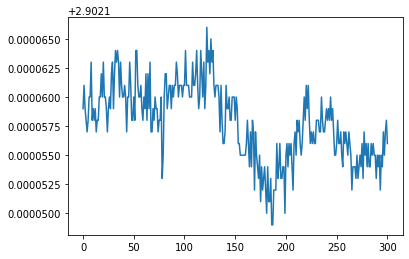

94Å


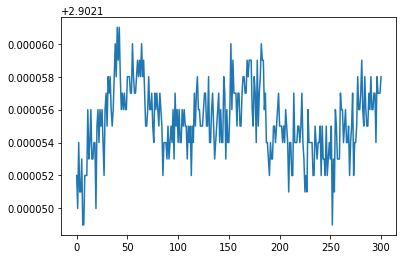

94Å


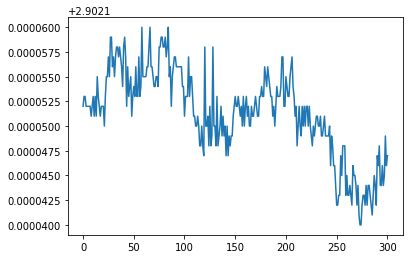

94Å


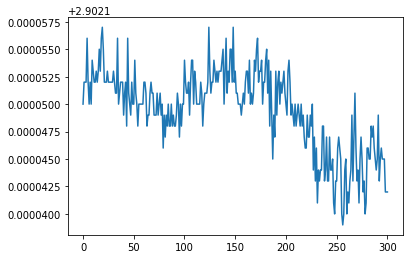

94Å


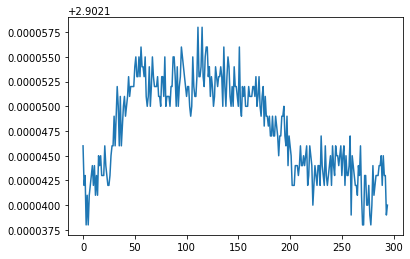

94Å


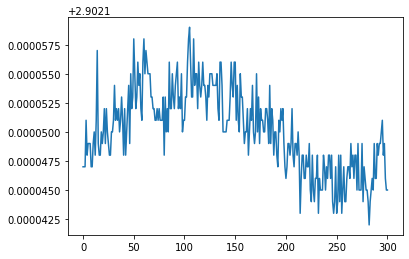

94Å


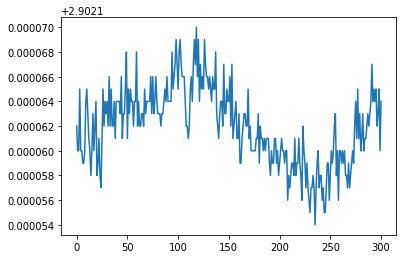

94Å


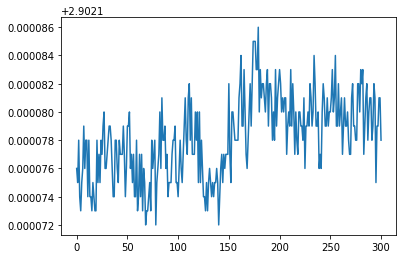

94Å


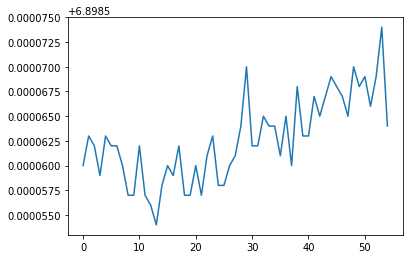

94Å


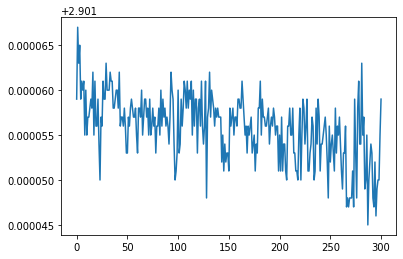

94Å


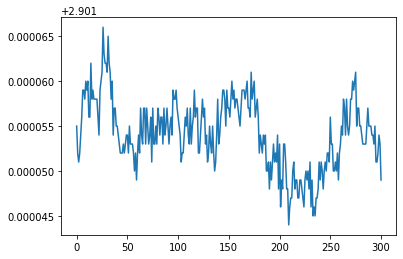

94Å


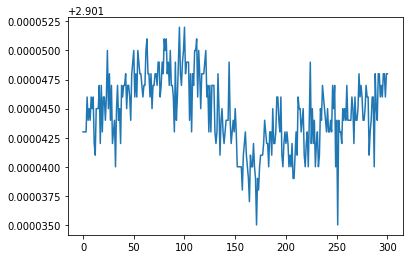

94Å


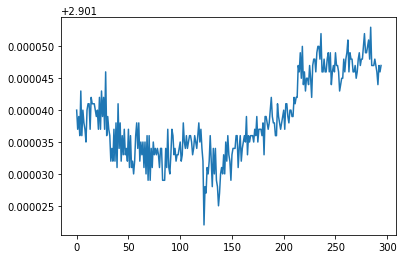

the max exposure times are []
the min exposure times are []
out of 20 given flare times, 0 were able to be found at94Å
delta exps are[]
131Å


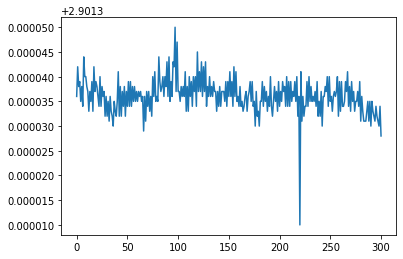

131Å


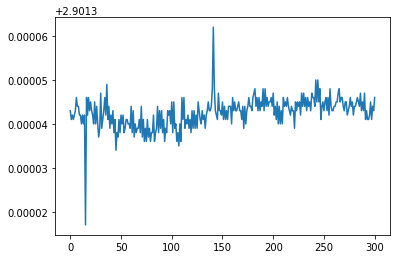

131Å


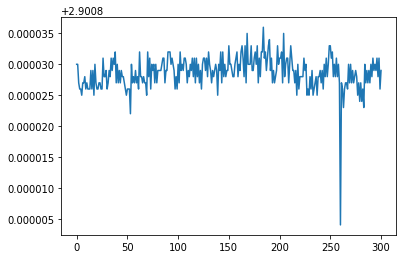

131Å


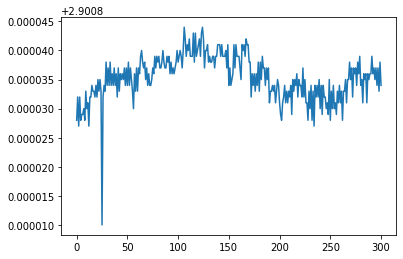

131Å


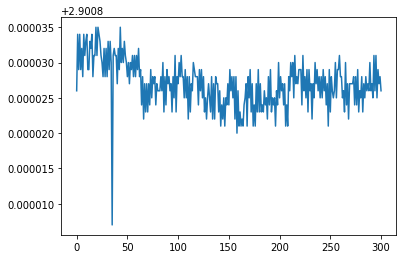

131Å


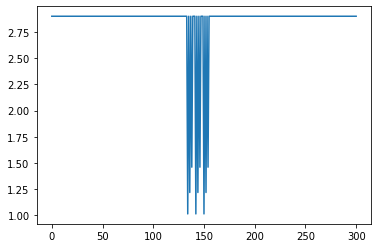

131Å


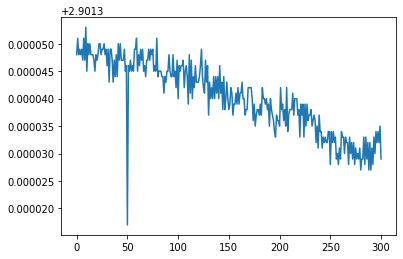

131Å


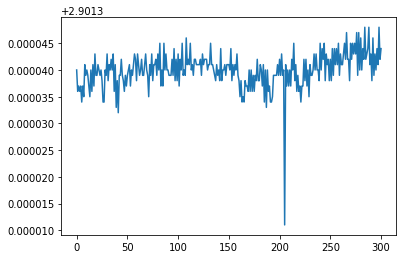

131Å


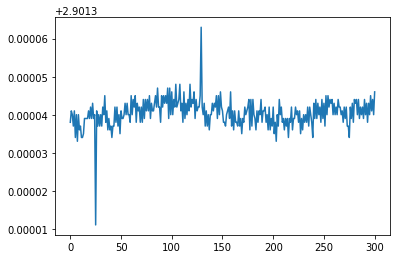

131Å


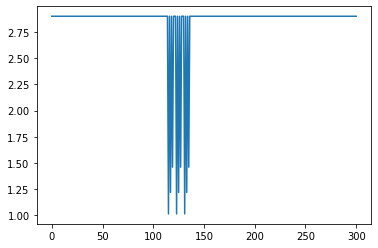

131Å


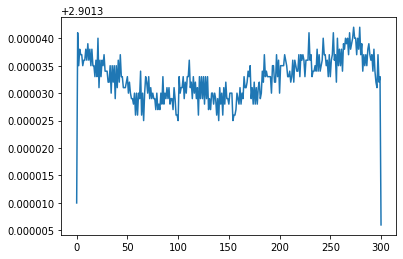

131Å


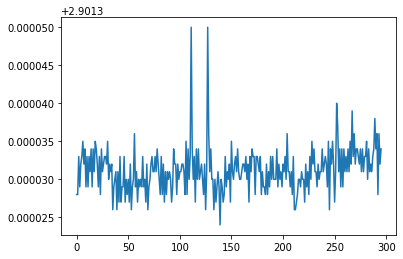

131Å


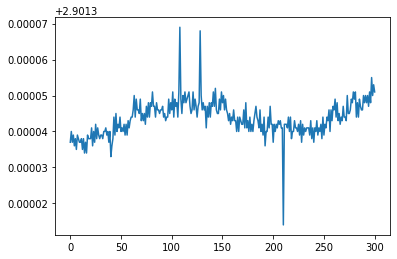

131Å


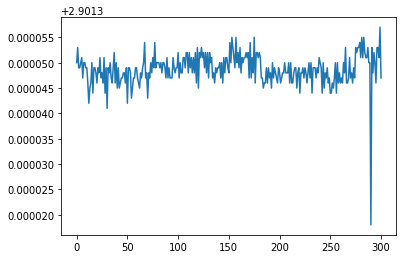

131Å


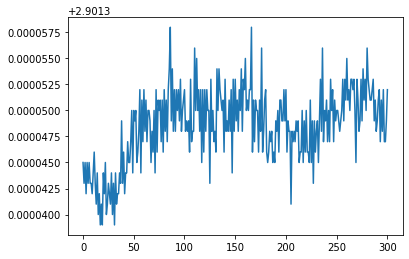

131Å


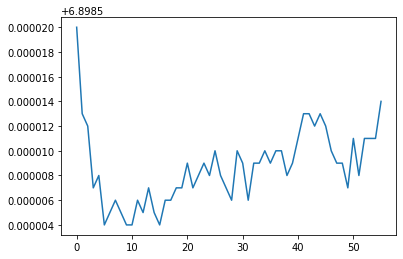

131Å


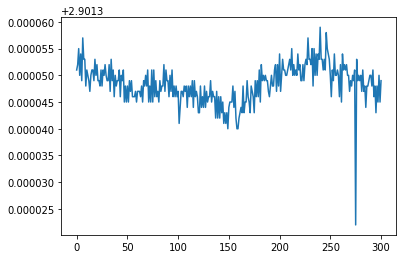

131Å


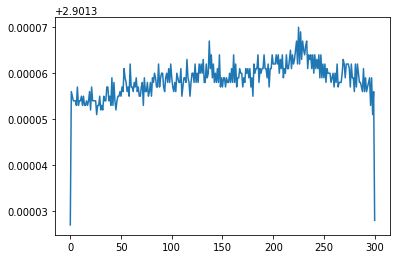

131Å


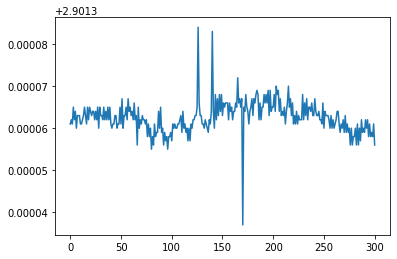

131Å


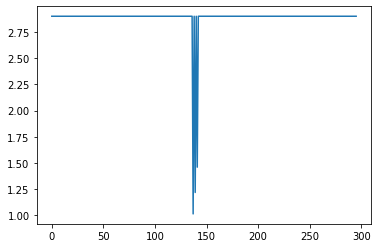

the max exposure times are [2.901354, 2.9013560000000003, 2.9013880000000003]
the min exposure times are [1.013041, 1.013045, 1.013074]
out of 20 given flare times, 3 were able to be found at131Å
delta exps are[1.888313, 1.8883110000000003, 1.8883140000000003]
max finds are
15
The wavelegnth with the most discernable features was [193]Å
The wavelength with the highest average delta exposure was 193Å


In [37]:
find_most_variance('C',class_flare,20,date)

In [ ]:
find_most_variance('B',class_flare,20,date)

One option for best wavelength, 131 angstroms. Largest delta exposure, but sharper peaks

131Å


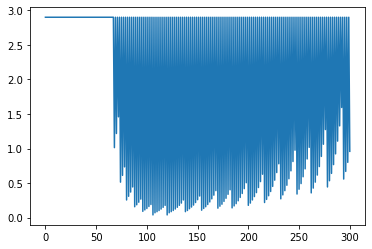

131Å


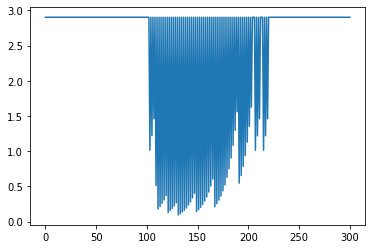

131Å


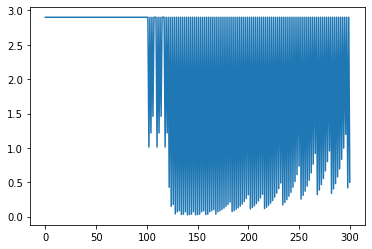

131Å


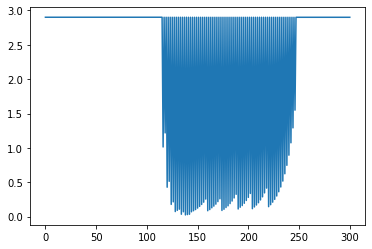

131Å


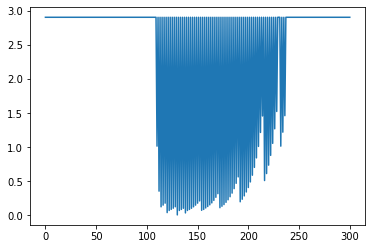

131Å


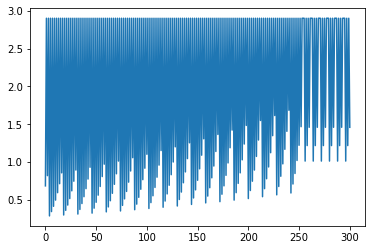

131Å


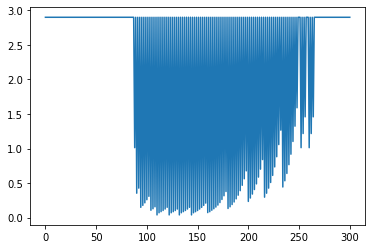

131Å


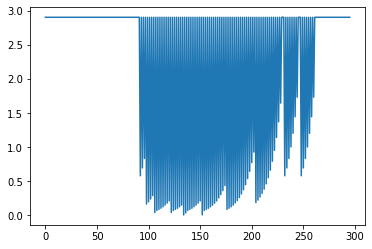

131Å


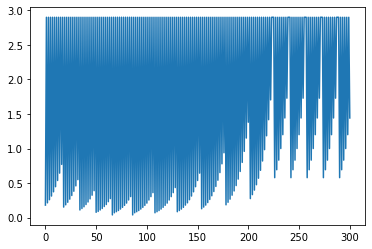

131Å


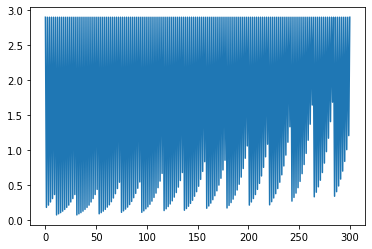

131Å


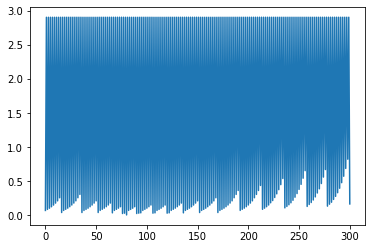

131Å


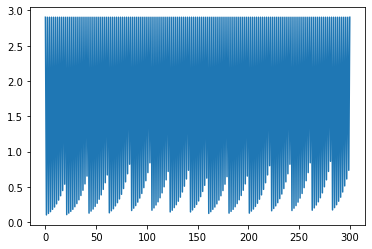

131Å


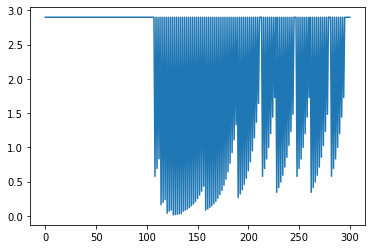

131Å


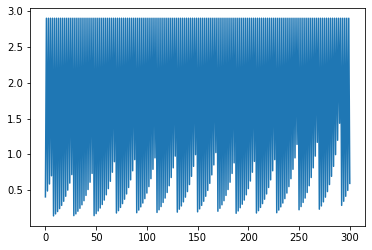

131Å


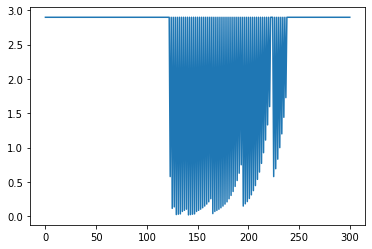

131Å


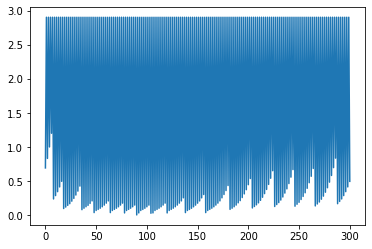

131Å


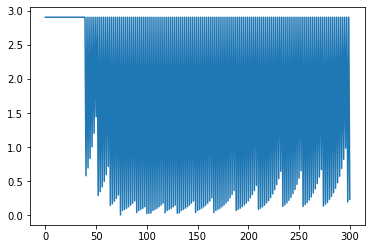

131Å


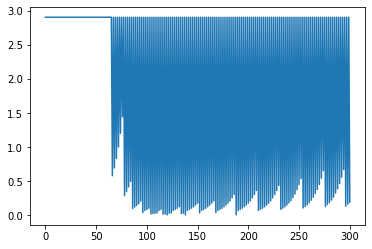

131Å


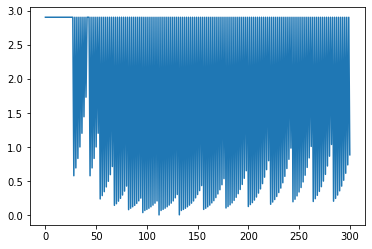

131Å


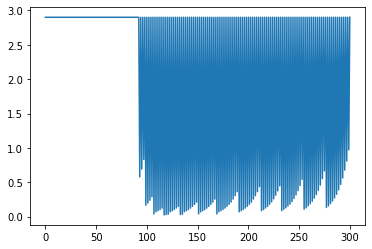

the max exposure times are [2.901363, 2.9014029999999997, 2.901361, 2.9013720000000003, 2.9013419999999996, 2.900874, 2.901381, 2.901338, 2.9012029999999998, 2.9012189999999998, 2.901247, 2.901247, 2.901236, 2.9012439999999997, 2.901327, 2.901402, 2.901369, 2.9013709999999997, 2.901381, 2.901355]
the min exposure times are [0.038918, 0.094541, 0.024311000000000003, 0.024353, 0.004869, 0.287581, 0.038932, 0.00485, 0.03884, 0.069746, 0.003711, 0.10263800000000001, 0.014573, 0.140704, 0.019452, 0.0048649999999999995, 0.004866, 0.004837, 0.004854, 0.024314]
out of 20 given flare times, 20 were able to be found at131Å


[2.862445,
 2.8068619999999997,
 2.87705,
 2.877019,
 2.896473,
 2.613293,
 2.8624490000000002,
 2.896488,
 2.8623629999999998,
 2.831473,
 2.897536,
 2.798609,
 2.886663,
 2.7605399999999998,
 2.8818750000000004,
 2.896537,
 2.896503,
 2.8965339999999995,
 2.8965270000000003,
 2.877041]

In [18]:
find_flares('X',20,class_flare,date,131)

131Å


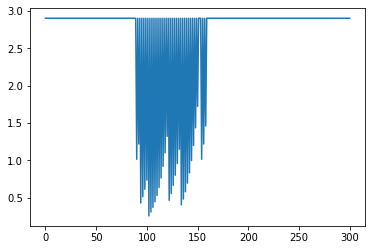

131Å


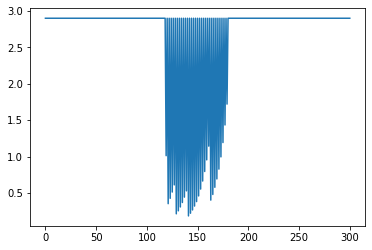

131Å


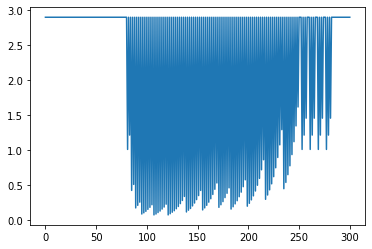

131Å


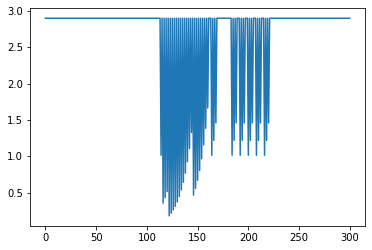

131Å


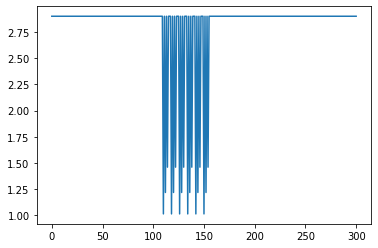

131Å


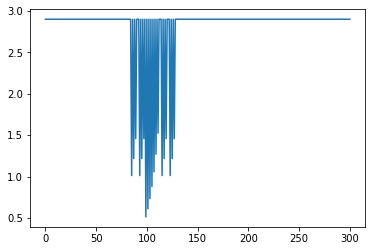

131Å


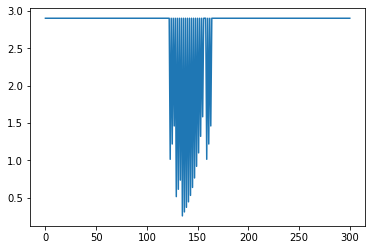

131Å


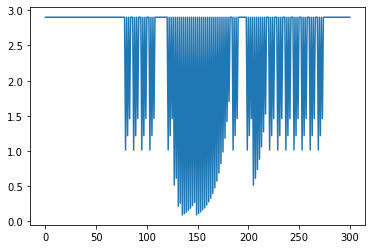

131Å


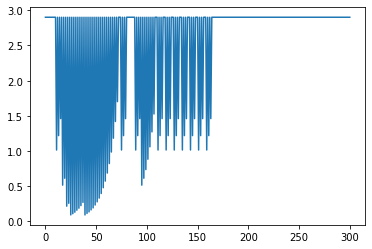

131Å


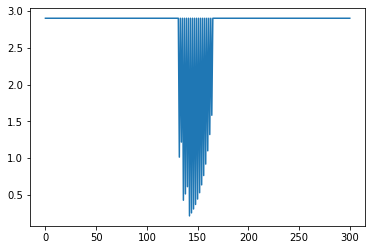

131Å


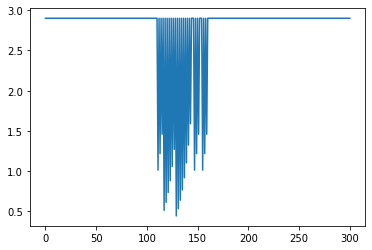

131Å


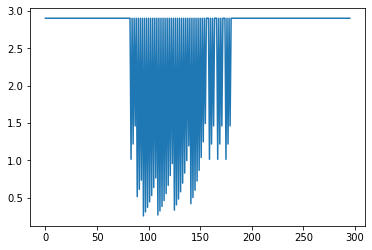

131Å


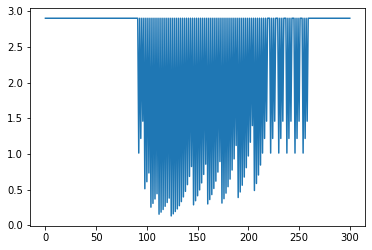

131Å


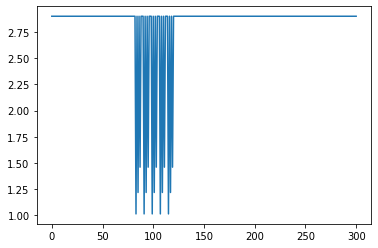

131Å


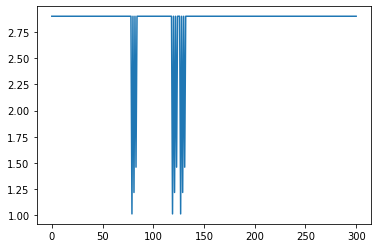

131Å


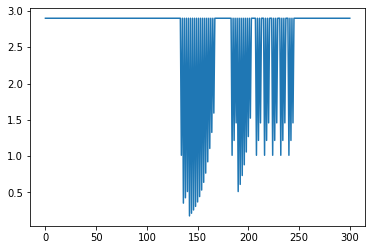

131Å


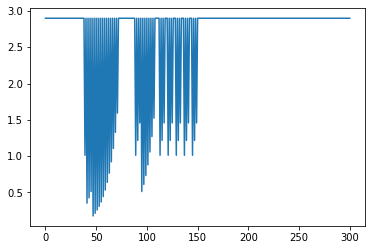

131Å


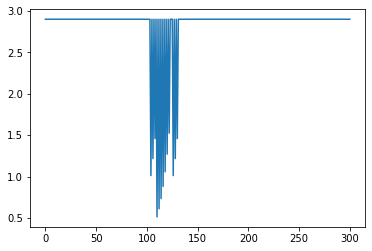

131Å


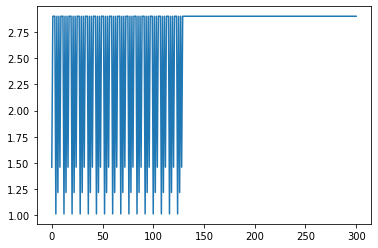

131Å


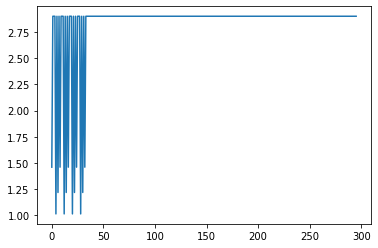

the max exposure times are [2.901376, 2.901378, 2.901355, 2.901402, 2.900837, 2.9008540000000003, 2.900857, 2.900865, 2.900874, 2.900863, 2.900881, 2.900862, 2.900856, 2.901373, 2.900864, 2.900861, 2.900861, 2.900864, 2.90088, 2.900882]
the min exposure times are [0.255274, 0.185683, 0.07740599999999999, 0.17744200000000002, 1.012529, 0.512758, 0.254782, 0.089422, 0.089422, 0.213829, 0.443204, 0.254779, 0.13213, 1.013052, 1.012549, 0.176939, 0.176939, 0.512837, 1.012548, 1.012541]
out of 20 given flare times, 20 were able to be found at131Å


[2.646102,
 2.7156949999999997,
 2.8239490000000003,
 2.72396,
 1.888308,
 2.388096,
 2.6460749999999997,
 2.811443,
 2.811452,
 2.687034,
 2.457677,
 2.646083,
 2.768726,
 1.888321,
 1.888315,
 2.723922,
 2.723922,
 2.388027,
 1.888332,
 1.8883410000000003]

In [31]:
find_flares('M',20,class_flare,date,131)

Another Option for wavelength, 193 angstroms, lower delta exposure but wider more regular peaks

193Å


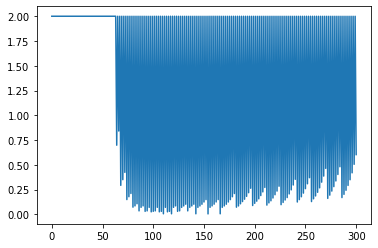

193Å


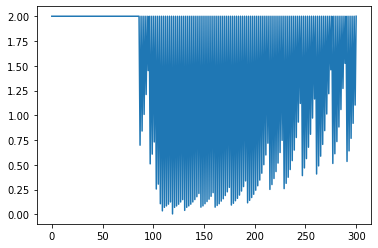

193Å


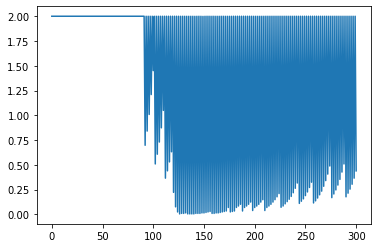

193Å


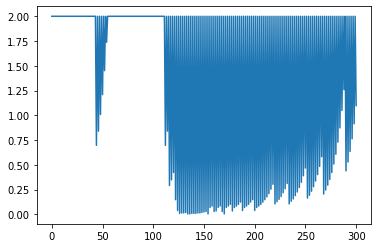

193Å


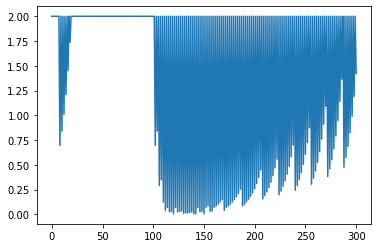

193Å


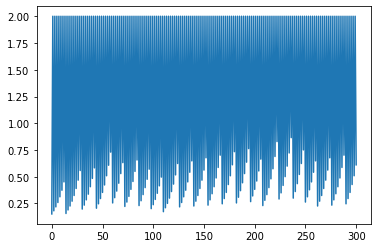

193Å


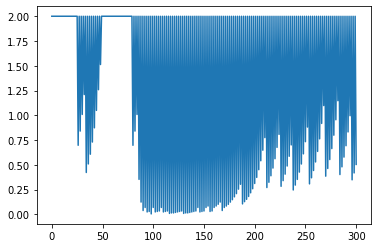

193Å


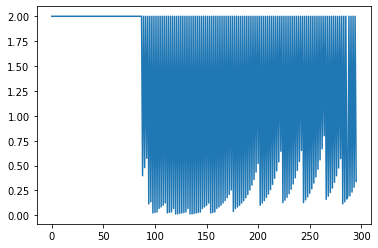

193Å


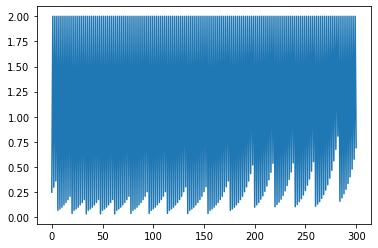

193Å


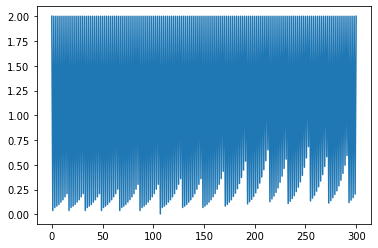

193Å


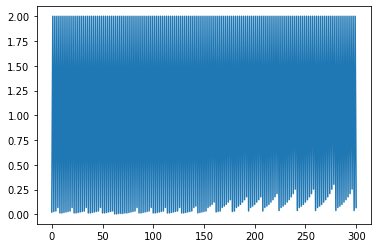

193Å


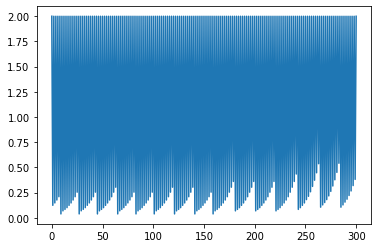

193Å


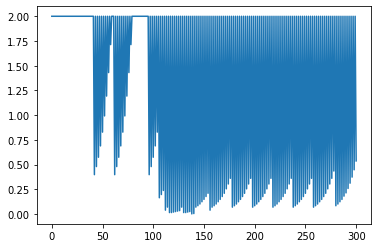

193Å


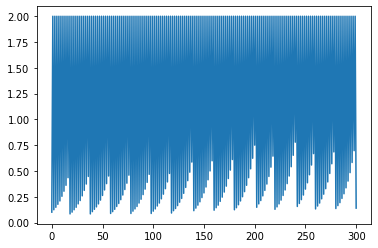

193Å


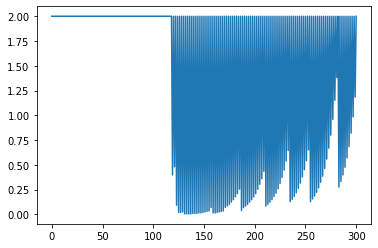

193Å


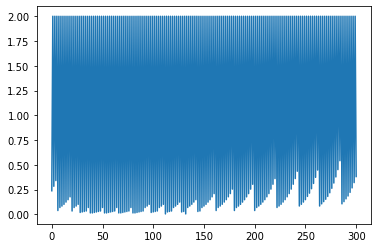

193Å


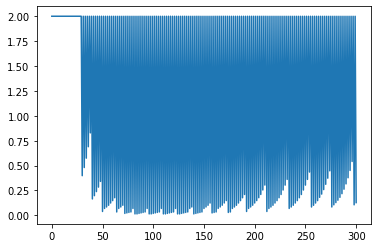

193Å


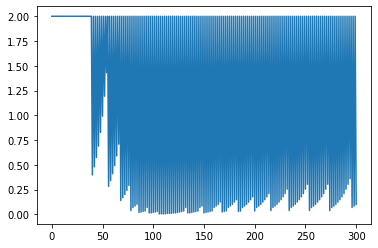

193Å


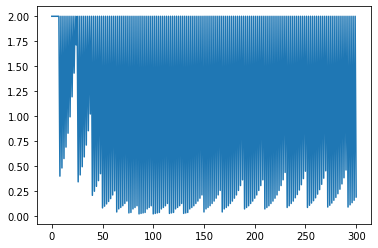

193Å


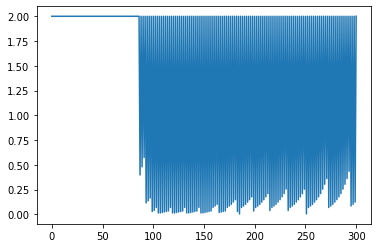

the max exposure times are [2.000096, 2.000089, 2.0000869999999997, 2.0000869999999997, 2.000099, 2.000104, 2.000091, 2.000085, 1.999856, 1.9998470000000002, 1.999852, 1.999852, 1.999855, 1.999591, 2.000068, 2.000077, 2.000069, 2.00007, 2.000069, 2.00006]
the min exposure times are [0.00371, 0.003635, 0.00487, 0.004915999999999999, 0.0048649999999999995, 0.15262, 0.00489, 0.014713, 0.034294, 0.004905, 0.004918, 0.039156, 0.001294, 0.083964, 0.004909, 0.004876, 0.014669999999999999, 0.004884, 0.01958, 0.004872]
out of 20 given flare times, 20 were able to be found at193Å


[1.996386,
 1.996454,
 1.9952169999999998,
 1.9951709999999998,
 1.9952340000000002,
 1.847484,
 1.9952009999999998,
 1.985372,
 1.965562,
 1.9949420000000002,
 1.994934,
 1.960696,
 1.998561,
 1.915627,
 1.9951590000000001,
 1.995201,
 1.985399,
 1.995186,
 1.980489,
 1.995188]

In [10]:
find_flares('X',20,class_flare,date,193)

193Å


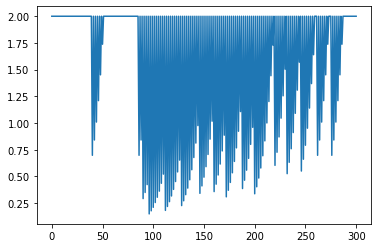

193Å


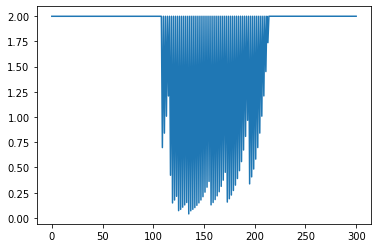

193Å


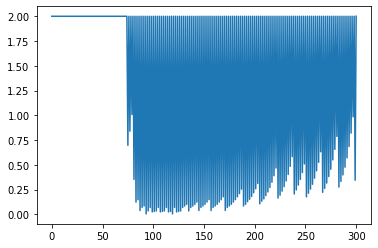

193Å


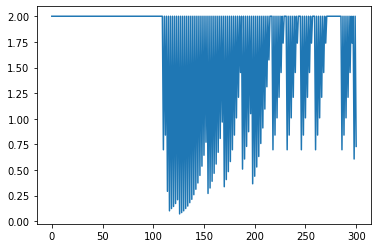

193Å


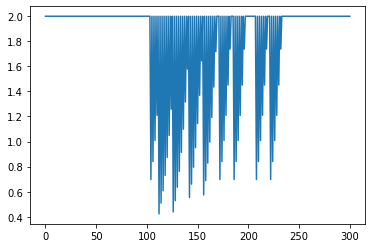

193Å


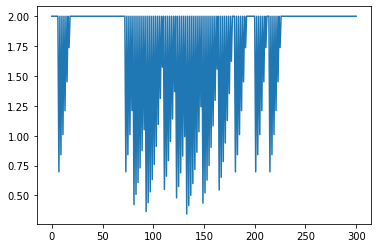

193Å


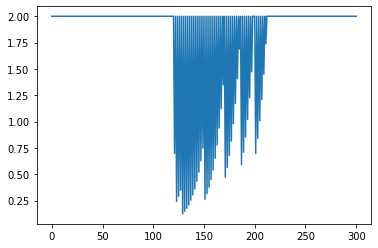

193Å


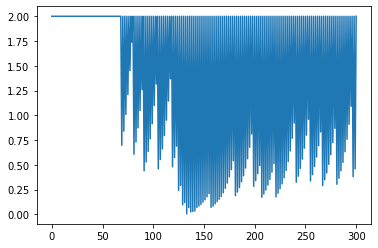

193Å


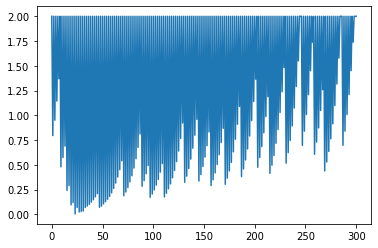

193Å


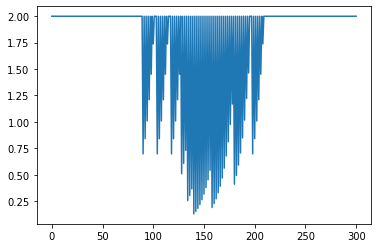

193Å


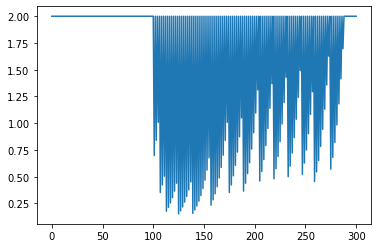

193Å


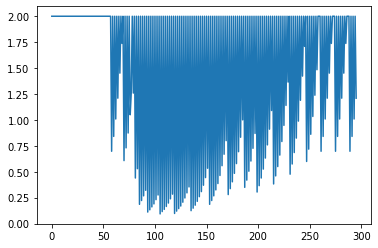

193Å


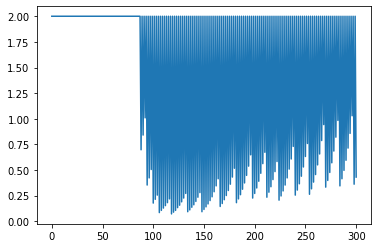

193Å


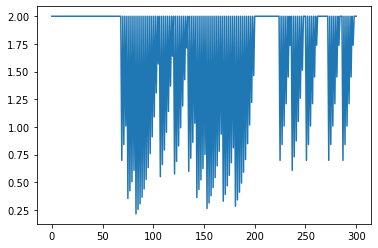

193Å


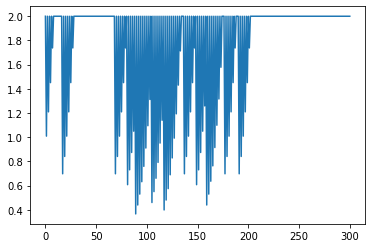

193Å


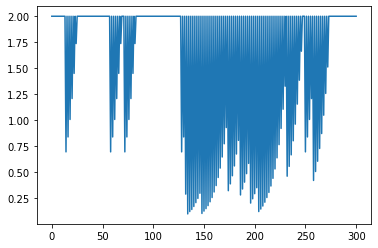

193Å


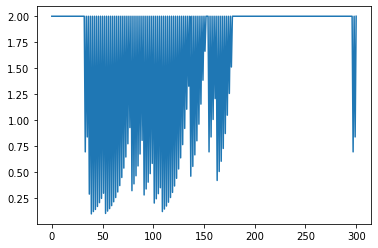

193Å


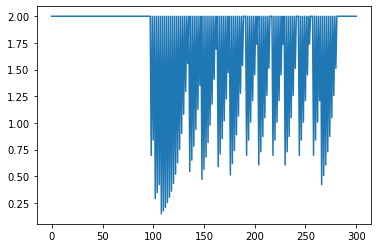

193Å


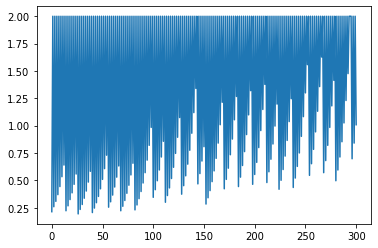

193Å


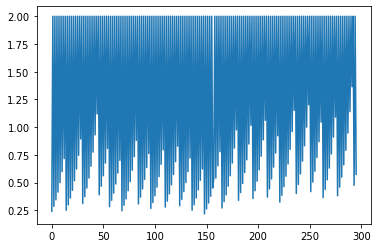

the max exposure times are [2.0000869999999997, 2.000095, 2.000095, 2.000092, 1.999685, 1.9996990000000001, 1.999681, 2.00009, 2.00009, 1.999707, 1.999689, 1.999668, 2.000102, 1.9996740000000002, 1.99968, 1.999679, 1.999679, 1.999675, 1.9996759999999998, 1.99967]
the min exposure times are [0.148569, 0.039243, 0.00489, 0.071903, 0.422713, 0.344885, 0.12404000000000001, 0.004889, 0.004889, 0.12846, 0.15221800000000002, 0.09275800000000001, 0.07191, 0.21379, 0.36536, 0.101386, 0.101386, 0.148128, 0.19331199999999998, 0.2179]
out of 20 given flare times, 20 were able to be found at193Å


[1.8515179999999998,
 1.960852,
 1.995205,
 1.928189,
 1.576972,
 1.654814,
 1.8756410000000001,
 1.9952010000000002,
 1.9952010000000002,
 1.8712469999999999,
 1.847471,
 1.9069099999999999,
 1.9281920000000001,
 1.7858840000000002,
 1.6343199999999998,
 1.898293,
 1.898293,
 1.851547,
 1.8063639999999999,
 1.78177]

In [11]:
find_flares('M',20,class_flare,date,193)